## Imports and loads

In [1]:
import os, sys
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import tensorflow as tf
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
from sklearn.metrics import r2_score
from sklearn import linear_model
from scipy.stats import linregress
from scipy.stats import spearmanr
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import StratifiedShuffleSplit
from scipy.signal import butter, filtfilt, lfilter, welch, lfilter_zi, stft
import pandas as pd
from scipy.stats import spearmanr
from sklearn.model_selection import LeaveOneOut
import pickle
from time import time
from  scipy.spatial.distance import squareform
import matplotlib.colors as colors
import matplotlib.cm as cmx
import pickle

In [2]:
!pip install mne==0.19
import mne
!pip install git+https://github.com/UN-GCPDS/python-gcpds.utils.git
from gcpds.utils import loaddb

     |████████████████████████████████| 6.4MB 12.2MB/s 
  Cloning https://github.com/UN-GCPDS/python-gcpds.utils.git to /tmp/pip-req-build-9dmbu61f
  Running command git clone -q https://github.com/UN-GCPDS/python-gcpds.utils.git /tmp/pip-req-build-9dmbu61f
  Created wheel for gcpds-utils: filename=gcpds_utils-0.1a3-cp36-none-any.whl size=96944 sha256=24c62ab28a0729aca739113b15c93a8198bd3a9299a22c8bf8ba1936076ca07a
  Stored in directory: /tmp/pip-ephem-wheel-cache-6skoh6vh/wheels/ab/4a/1e/d215a31a12c0fa202a9bccc9b9d68874deb08dfdce8b7d43c8
Successfully built gcpds-utils


In [3]:
from mne.io.pick import _picks_to_idx
from mne.viz.topomap import _check_outlines, _draw_outlines
from mne.viz import plot_topomap

In [4]:
FILEID = "1Oz0eBrVKJdAYXYuRJrMPHgIihW5YaUA5"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O Data_rest_giga.zip && rm -rf /tmp/cookies.txt
!dir
!unzip Data_rest_giga.zip

--2021-01-22 22:04:19--  https://docs.google.com/uc?export=download&confirm=&id=1Oz0eBrVKJdAYXYuRJrMPHgIihW5YaUA5
Resolving docs.google.com (docs.google.com)... 172.217.13.78, 2607:f8b0:4004:829::200e
Connecting to docs.google.com (docs.google.com)|172.217.13.78|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-04-4k-docs.googleusercontent.com/docs/securesc/c36qrq5tjv447v9mjbn1n7bcjteoctfb/dget8m8kvup90u9q46sphfonk79222m9/1611353025000/13064322042220169363/13037623868579804421Z/1Oz0eBrVKJdAYXYuRJrMPHgIihW5YaUA5?e=download [following]
--2021-01-22 22:04:21--  https://doc-04-4k-docs.googleusercontent.com/docs/securesc/c36qrq5tjv447v9mjbn1n7bcjteoctfb/dget8m8kvup90u9q46sphfonk79222m9/1611353025000/13064322042220169363/13037623868579804421Z/1Oz0eBrVKJdAYXYuRJrMPHgIihW5YaUA5?e=download
Resolving doc-04-4k-docs.googleusercontent.com (doc-04-4k-docs.googleusercontent.com)... 172.217.7.161, 2607:f8b0:4004:800::2001
Connecting to doc-04-4k-do

## Network definition

In [5]:
seed = 100
np.random.seed(seed)
tf.random.set_seed(seed)
        
class SMRfeat(BaseEstimator, TransformerMixin):
  def __init__(self):
    self
      
  
  def scalerlist(self,Xfull):
     self.scaler = len(Xfull)*[None]
     for i in range(len(Xfull)):
        self.scaler[i] = StandardScaler()
        Xfull[i] = self.scaler[i].fit_transform(Xfull[i])
     return Xfull


  def fit(self,Xepochs,*_):
      
      Xfull = [Xepochs[:,:,i] for i in range(Xepochs.shape[2])]


      
      self.scalerlist(Xfull)
      return 

  def transform(self,Xepochs,*_):   
      
          
      
      Xfull = [Xepochs[:,:,i] for i in range(Xepochs.shape[2])]

      
      for i in range(len(Xfull)):
         self.scaler[i] = StandardScaler()
         Xfull[i] = self.scaler[i].fit_transform(Xfull[i])
      return Xfull

  def fit_transform(self,Xepochs,*_):
      self.fit(Xepochs)
      return self.transform(Xepochs)   
class MCSMRDNN_transfer(BaseEstimator, TransformerMixin):
  def __init__(self,epochs=200,batch_size=32,learning_rate=1e-3,optimizer='Adam',
                l1_param=1e-3,l2_param=1e-3,validation_split=0.2,verbose=0,fs=512,scalex=1,scaley=1,droprate=0.2,Mc_iter=100,alpha_dropout=True,plot_hst = False,
                path_in=None, path_out=None, run = None,initial_run=False):
        self.epochs = epochs
        self.scalex = scalex
        self.scaley = scaley
        self.batch_size = batch_size
        self.learning_rate=learning_rate 
        self.l1_param=l1_param 
        self.l2_param=l2_param
        self.validation_split = validation_split
        self.verbose = verbose
        self.optimizer = optimizer
        self.fs=fs
        self.droprate = droprate
        self.Mc_iter = Mc_iter
        self.alpha_dropout = alpha_dropout
        self.plot_hst = plot_hst
        self.path_in = path_in
        self.path_out = path_out
        self.run = run
        self.initial_run =initial_run
  
  def fit(self,X,y,*_):

    #entrenar predictor SMRDNN
    if self.optimizer == "Adam":
        opt = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
    elif self.optimizer == "SGD":
        opt = tf.keras.optimizers.SGD(learning_rate=self.learning_rate)
    else:
        opt=self.optimizer
    
    tf.keras.backend.clear_session()
    seed = 100
    np.random.seed(seed)
    tf.random.set_seed(seed)
    Q1f = 1.5
    Qff = 0.5
    l1 = self.l1_param
    l2 = self.l2_param
    act1 = 'tanh'
    actf = 'tanh'
    inputs = len(X)*[None]
    hiddens = len(X)*[None]
    drop_1 = len(X)*[None]
    winitializer = tf.keras.initializers.GlorotNormal(seed=seed)
    binitializer = "zeros"
    #h1
    for i in range(len(X)):
        inputs[i] = tf.keras.layers.Input(shape=(X[i].shape[1]), name='in_'+str(i))
        hiddens[i] = tf.keras.layers.Dense(int(X[i].shape[1]*Q1f),activation=act1,kernel_regularizer=tf.keras.regularizers.l1_l2(l1=l1,l2=l2),kernel_initializer=winitializer,bias_initializer=binitializer,name='h1_'+str(i))(inputs[i])
        if self.alpha_dropout:
            drop_1[i] = tf.keras.layers.AlphaDropout(self.droprate,seed=seed)(hiddens[i])
        else:
            drop_1[i] = tf.keras.layers.Dropout(self.droprate)(hiddens[i])
    #concat
    concat = tf.keras.layers.concatenate(drop_1,name='concat')
    #concat = tf.keras.layers.concatenate([h1c3psd,h1c4psd],name='concat')
    Qh = np.sum([X[i].shape[1]*Q1f for i in range(len(X))])
    
    hfi = tf.keras.layers.Dense(Qh*Qff,activation=actf,kernel_regularizer=tf.keras.regularizers.l1_l2(l1=l1,l2=l2),
                              kernel_initializer=winitializer,
                              bias_initializer=binitializer,name='hfi')(concat)
    if self.alpha_dropout:
        drop_2 = tf.keras.layers.AlphaDropout(rate=self.droprate)(hfi)
    else:
        drop_2 = tf.keras.layers.Dropout(rate=self.droprate)(hfi)
    #cla
    output_c = tf.keras.layers.Dense(1,activation="linear",kernel_initializer=winitializer, bias_initializer=binitializer,
                                    kernel_regularizer=tf.keras.regularizers.l1_l2(l1=l1,l2=l2),name='outc')(drop_2) 
    #input_full = [ic3_tuz,ic4_tuz,ic3_tbz,ic4_tbz,ic3_psdz,ic4_psdz]
    self.model_fun = tf.keras.Model(inputs=inputs,outputs=[output_c])

    self.model_fun.compile(loss=tf.keras.losses.mae,#self.custom_loss(),
              optimizer=opt) #f1, precision, recall, crossentropy
    
    if initial_run:
        self.history = self.model_fun.fit(x=X, y=y,verbose=self.verbose, 
                                        epochs=self.epochs,batch_size=self.batch_size,validation_split=self.validation_split)
        self.model_fun.save_weights(self.path_out)
    else:
        self.model_fun.load_weights(self.path_in)
        self.history = self.model_fun.fit(x=X, y=y,verbose=self.verbose, 
                                        epochs=self.epochs,batch_size=self.batch_size,validation_split=self.validation_split)
        self.model_fun.save_weights(self.path_out)

    
    if self.plot_hst:
        self.plot_history_acc_w()
  def predict(self, X, *_):
    return np.stack([self.model_fun(X,training=True) for sample in range(self.Mc_iter)])#self.model_fun.predict(X)

  def fit_predict(self,X,y,*_):
      self.fit(X,y)
      return  self.predict(X)
  def get_model(self):
      return self.model_fun
  def plot_history_acc_w(self):
      hpd = pd.DataFrame(self.history.history)
      #hpd[['loss','val_loss']].plot()
      hpd.plot()
      plt.show()
      return


## Funtions definitions

In [6]:
def get_weigths(model,bands):
    W = []
    for i in range(bands):
        w = np.sum(abs(mdl.get_layer('h1_'+str(i)).get_weights()[0]),axis=1)
        w = w-min(w)
        w/= max(w)
        W.append(w)
    return W

In [7]:
def create_tensor_giga(graf,ind):
    xtensor = []
    for i in ind:
      if i>= 29 and i<34:
        subjs= graf[i-2,:,:]
      elif i>=34:
        subjs= graf[i-3,:,:]
      else:
        subjs= graf[i-1,:,:]

      try:
        xtensor+=[subjs]
      except:
        print('s'+str(i+1))

    xtensor= np.asarray(xtensor)
    print(xtensor.shape)
    return xtensor

In [8]:
def plot_topomap_cx(rho,fs, channels_names,montage,Ch,thr=0.5,size=(10,10),mode="topo",weigths=True,cmaps="jet",colormap=True,save=False,name=""):
    layout = mne.channels.read_layout('EEG1005')
    info = mne.create_info(layout.names, sfreq=fs, ch_types="eeg",montage=montage)
    pos = np.array([(p[0] + p[2] / 2., p[1] + p[3] / 2.) for p in layout.pos])

    # pick channels
    picks = _picks_to_idx(info,channels_names)
    pos = pos[picks]
    # adjust positions
    pos, outlines = _check_outlines(pos, 'head')
    pos_x = pos[:,0]
    pos_y = pos[:,1]
    names = np.array(layout.names)[picks]
    rho=((rho-rho.min())/(rho.max()-rho.min()))
    cmap = plt.cm.jet
    cNorm  = colors.Normalize(vmin=np.min(rho), vmax=np.max(rho))
    scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)

    if weigths:
        rhotopo = squareform(rho).sum(axis=1)
    else:
        rhotopo = rho
    rhotopo = rhotopo-rhotopo.min()
    rhotopo /= rhotopo.max()
    
    f = plt.figure(figsize=size)
    ax = plt.axes()

    if mode=="topo":
        #P = int(0.5*Ch*(Ch-1))

        #plt.figure(figsize=(10,10))
        plot_topomap(rhotopo, pos, cmap=cmaps, show=False, contours=0, sensors=False,vmin=0,vmax=1)

    elif mode=="Cx":
        rhok = squareform(rho)

        if thr >1:
            indx_pct = np.where(np.triu(rhok)>np.percentile(rho, thr))
        else:
            indx_pct = np.where(np.triu(rhok)>thr)
        ax.set(xticks=[], yticks=[], aspect='equal')
        #ax[frec,time].scatter(pos[:,0],pos[:,1],100)
        _draw_outlines(ax, outlines)
        for i in range(np.shape(indx_pct)[-1]):
            ch1=indx_pct[0][i]
            ch2=indx_pct[1][i]     
            ax.arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                    pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,
                    width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
        for ch1 in  np.unique(np.ravel(indx_pct)):
            ax.scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
            ax.annotate(names[ch1], xy=pos[ch1,:],size=15)
        ax.axis("off")
    elif mode=="All":
        plot_topomap(rhotopo, pos, cmap=cmaps, show=False, contours=0, sensors=False,vmin=0,vmax=1)
        rhok = squareform(rho)

        if thr >1:
            indx_pct = np.where(np.triu(rhok)>np.percentile(rho, thr))
        else:
            indx_pct = np.where(np.triu(rhok)>thr)
        ax.set(xticks=[], yticks=[], aspect='equal')
        #ax[frec,time].scatter(pos[:,0],pos[:,1],100)
        _draw_outlines(ax, outlines)
        for i in range(np.shape(indx_pct)[-1]):
            ch1=indx_pct[0][i]
            ch2=indx_pct[1][i]     
            ax.arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                    pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,
                    width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
        for ch1 in  np.unique(np.ravel(indx_pct)):
            ax.scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
            ax.annotate(names[ch1], xy=pos[ch1,:],size=15)
        

    if colormap:
        cax = f.add_axes([0.95, 0.125, 0.02, 0.75])
        sm = plt.cm.ScalarMappable(cmap='jet')
        sm.set_array(rho.ravel())
        plt.colorbar(sm,cax=cax)
    
    if save:
        plt.savefig(name+'.eps',format='eps',dpi=100,bbox_inches='tight')

    plt.show()

## Path definition

In [9]:
Path_def = "/content/drive/MyDrive/Papers/CX_Regression/codigos/giga/Figs/"

## load data and run

In [10]:
FILEID = "1dvuv8b5Ld6aKIVmJ5kOaMxHm3u5GCvch"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O connectividades_daniel.zip && rm -rf /tmp/cookies.txt
!dir
!unzip connectividades_daniel.zip

--2021-01-22 22:04:25--  https://docs.google.com/uc?export=download&confirm=&id=1dvuv8b5Ld6aKIVmJ5kOaMxHm3u5GCvch
Resolving docs.google.com (docs.google.com)... 142.250.73.206, 2607:f8b0:4004:807::200e
Connecting to docs.google.com (docs.google.com)|142.250.73.206|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0k-ak-docs.googleusercontent.com/docs/securesc/ohlkmikgocmiujjfkh6c79a5g8lgnb37/0poh6ucl4rke6mnkcrvd0tc7uecprvea/1611353025000/17600740636788319470/05419148791918442210Z/1dvuv8b5Ld6aKIVmJ5kOaMxHm3u5GCvch?e=download [following]
--2021-01-22 22:04:25--  https://doc-0k-ak-docs.googleusercontent.com/docs/securesc/ohlkmikgocmiujjfkh6c79a5g8lgnb37/0poh6ucl4rke6mnkcrvd0tc7uecprvea/1611353025000/17600740636788319470/05419148791918442210Z/1dvuv8b5Ld6aKIVmJ5kOaMxHm3u5GCvch?e=download
Resolving doc-0k-ak-docs.googleusercontent.com (doc-0k-ak-docs.googleusercontent.com)... 172.217.7.161, 2607:f8b0:4004:800::2001
Connecting to doc-0k-ak-

In [11]:
#cargar target por runs
target = pickle.load( open( "/content/drive/MyDrive/Papers/CX_Regression/codigos/giga/target_por_runs/target_giga_runs2seg_5time_2frec.p", "rb" ) ) 

Target_run=[]
for i in range(5):
  run_n = []
  for j in range(len(target['acc_subj'])):
    if target['acc_subj'][j].shape[0]>=i+1:
      run_n.append(target['acc_subj'][j][i])
    else:
      run_n.append(target['acc_subj'][j][-1])
  Target_run.append(np.asarray(run_n))  

In [12]:
data=pickle.load( open( "connectividad_daniel_giga_3bandas.pickle", "rb" ) )[:,:,:,0]
indx = loadmat('Means_giga_mayo.mat')['S1'].ravel()
xtensor = create_tensor_giga (data,indx )

(50, 2016, 3)


/usr/local/lib/python3.6/dist-packages/mne/utils/docs.py:824: DeprecationWarning: Function read_montage is deprecated; ``read_montage`` is deprecated and will be removed in v0.20. Please use ``read_dig_fif``, ``read_dig_egi``, ``read_custom_montage``, or ``read_dig_captrack`` to read a digitization based on your needs instead; or ``make_standard_montage`` to create ``DigMontage`` based on template; or ``make_dig_montage`` to create a ``DigMontage`` out of np.arrays
  warnings.warn(msg, category=DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/mne/utils/docs.py:807: DeprecationWarning: Class Montage is deprecated; Montage class is deprecated and will be removed in v0.20. Please use DigMontage instead.
  warnings.warn(msg, category=DeprecationWarning)


grupos:  [2, None, None]
run:  1
Epoch 1/200
1/1 [==============================] - 3s 3s/step - loss: 724.0068 - val_loss: 711.7944
Epoch 2/200
1/1 [==============================] - 0s 81ms/step - loss: 748.3434 - val_loss: 696.6907
Epoch 3/200
1/1 [==============================] - 0s 78ms/step - loss: 693.3616 - val_loss: 686.3170
Epoch 4/200
1/1 [==============================] - 0s 80ms/step - loss: 692.5184 - val_loss: 664.1042
Epoch 5/200
1/1 [==============================] - 0s 78ms/step - loss: 666.2852 - val_loss: 635.0220
Epoch 6/200
1/1 [==============================] - 0s 76ms/step - loss: 639.8345 - val_loss: 610.4658
Epoch 7/200
1/1 [==============================] - 0s 195ms/step - loss: 615.6920 - val_loss: 588.1665
Epoch 8/200
1/1 [==============================] - 0s 78ms/step - loss: 593.1133 - val_loss: 568.4761
Epoch 9/200
1/1 [==============================] - 0s 79ms/step - loss: 570.7686 - val_loss: 550.5417
Epoch 10/200
1/1 [==============================] 

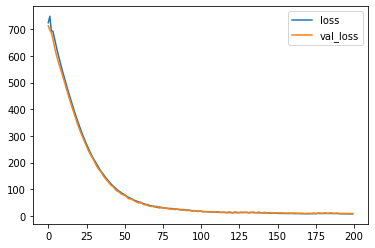

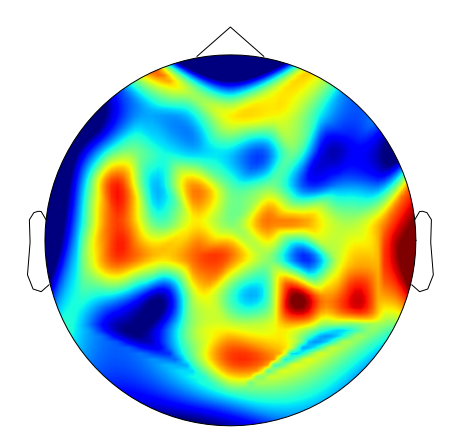

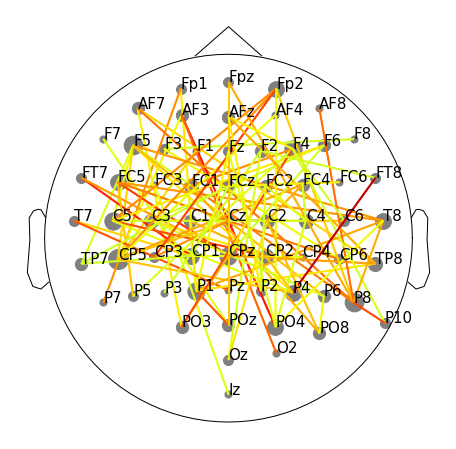

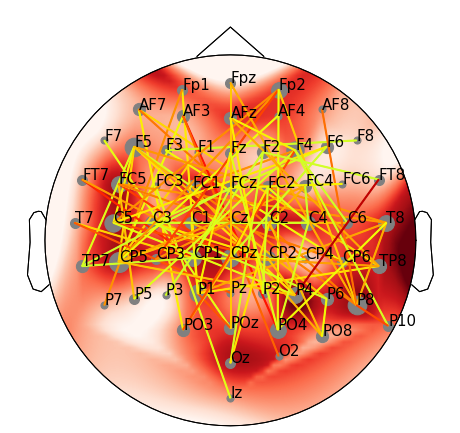

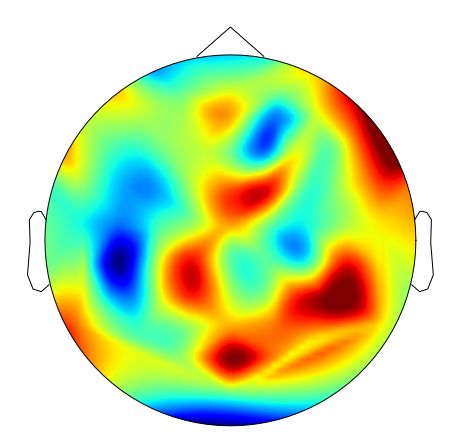

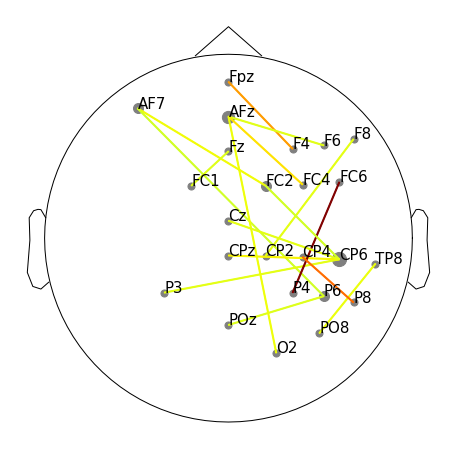

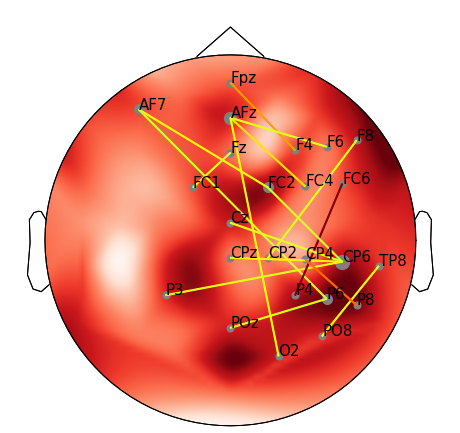

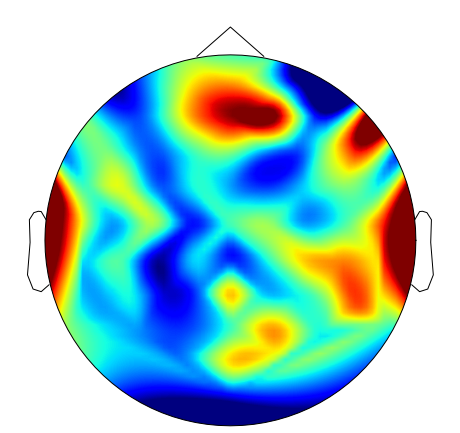

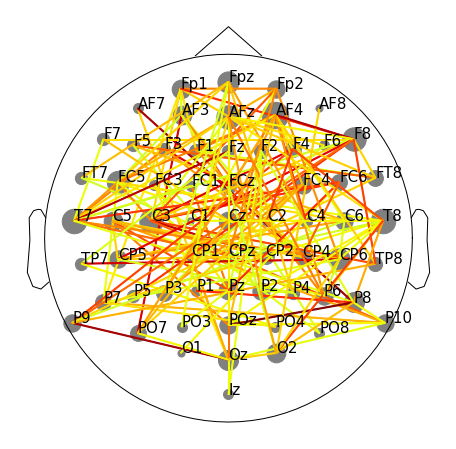

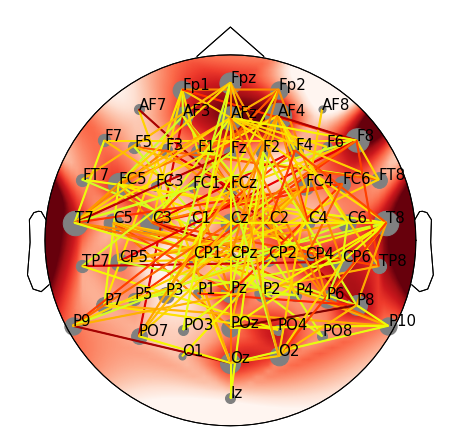

run:  2
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 7.9471 - val_loss: 8.5362
Epoch 2/200
1/1 [==============================] - 0s 90ms/step - loss: 7.7122 - val_loss: 8.5405
Epoch 3/200
1/1 [==============================] - 0s 83ms/step - loss: 7.6963 - val_loss: 8.3560
Epoch 4/200
1/1 [==============================] - 0s 81ms/step - loss: 7.6449 - val_loss: 8.5233
Epoch 5/200
1/1 [==============================] - 0s 79ms/step - loss: 7.5331 - val_loss: 9.0006
Epoch 6/200
1/1 [==============================] - 0s 84ms/step - loss: 7.7264 - val_loss: 8.6100
Epoch 7/200
1/1 [==============================] - 0s 78ms/step - loss: 7.3682 - val_loss: 8.3883
Epoch 8/200
1/1 [==============================] - 0s 77ms/step - loss: 7.6167 - val_loss: 8.6176
Epoch 9/200
1/1 [==============================] - 0s 77ms/step - loss: 7.2840 - val_loss: 9.3470
Epoch 10/200
1/1 [==============================] - 0s 77ms/step - loss: 7.9222 - val_loss: 8.8880
Epoch 11/200


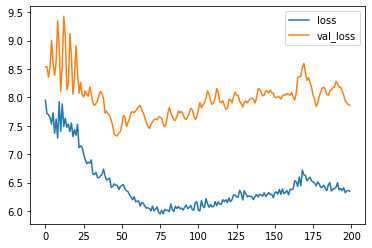

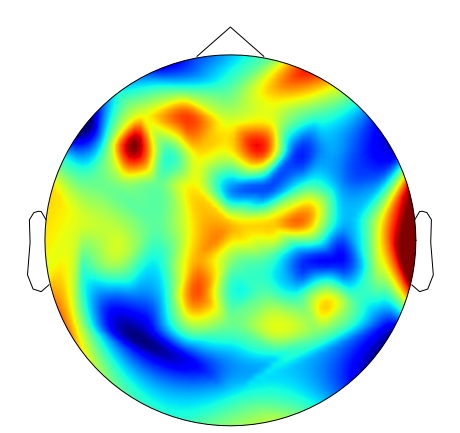

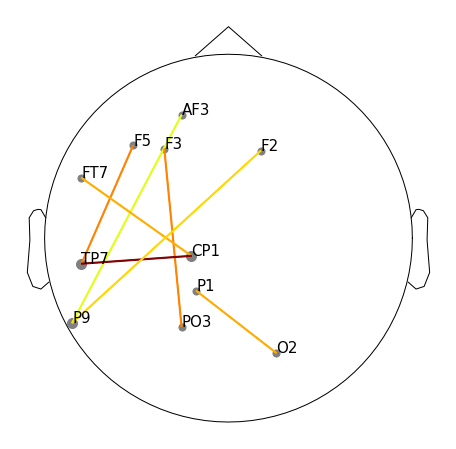

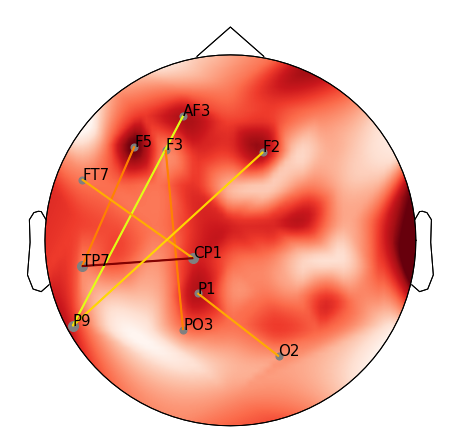

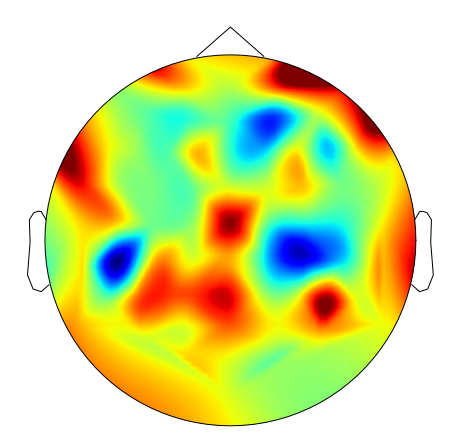

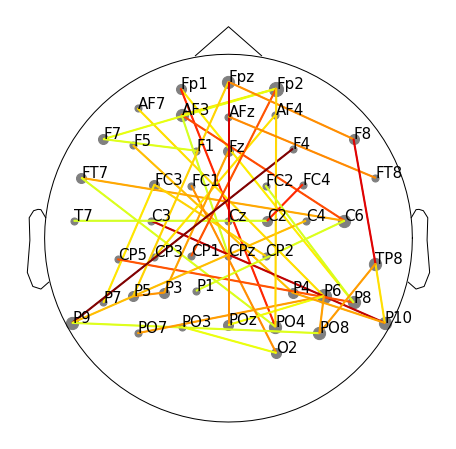

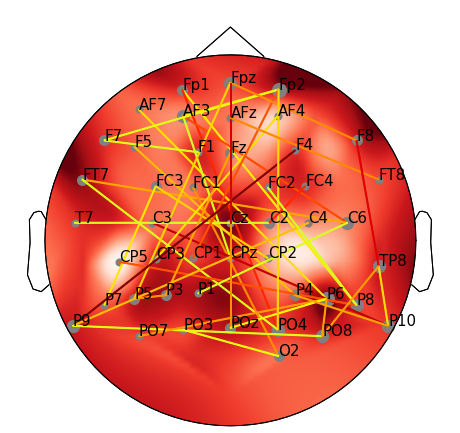

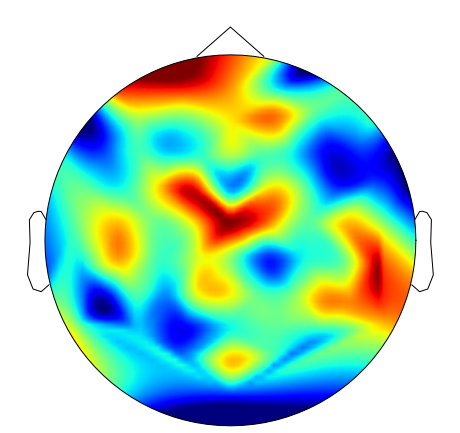

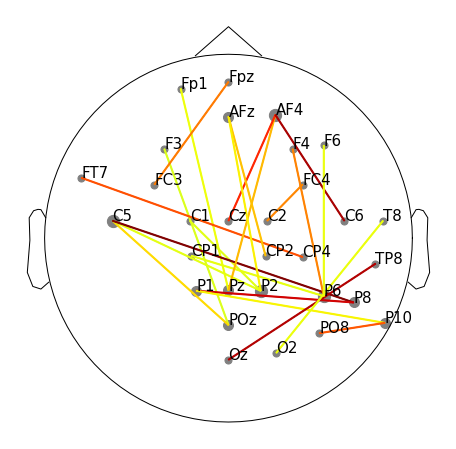

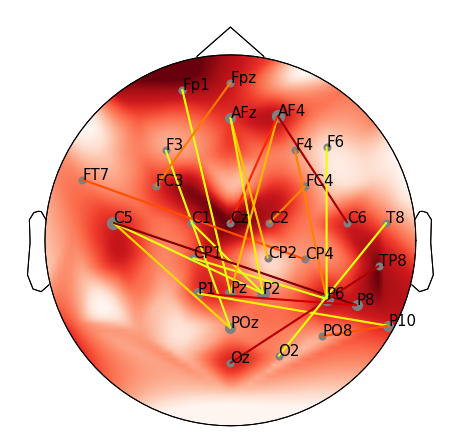

run:  3
Epoch 1/200
1/1 [==============================] - 1s 974ms/step - loss: 6.8434 - val_loss: 6.5232
Epoch 2/200
1/1 [==============================] - 0s 87ms/step - loss: 6.8513 - val_loss: 6.4640
Epoch 3/200
1/1 [==============================] - 0s 111ms/step - loss: 6.7395 - val_loss: 6.3823
Epoch 4/200
1/1 [==============================] - 0s 224ms/step - loss: 6.6454 - val_loss: 6.3516
Epoch 5/200
1/1 [==============================] - 0s 82ms/step - loss: 6.5620 - val_loss: 6.5228
Epoch 6/200
1/1 [==============================] - 0s 80ms/step - loss: 6.6993 - val_loss: 6.6564
Epoch 7/200
1/1 [==============================] - 0s 79ms/step - loss: 6.5874 - val_loss: 6.9145
Epoch 8/200
1/1 [==============================] - 0s 78ms/step - loss: 6.4638 - val_loss: 7.2851
Epoch 9/200
1/1 [==============================] - 0s 79ms/step - loss: 6.5281 - val_loss: 7.4684
Epoch 10/200
1/1 [==============================] - 0s 88ms/step - loss: 6.4909 - val_loss: 7.6973
Epoch 11

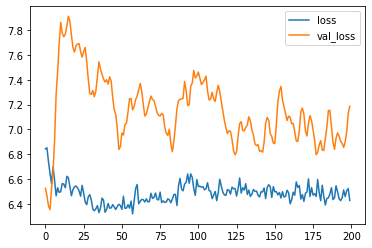

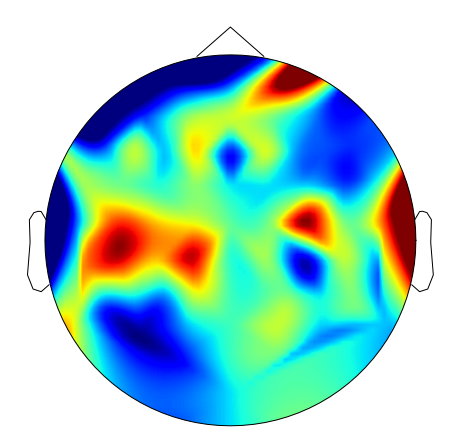

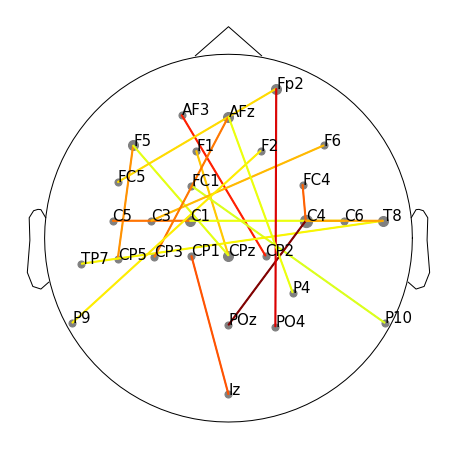

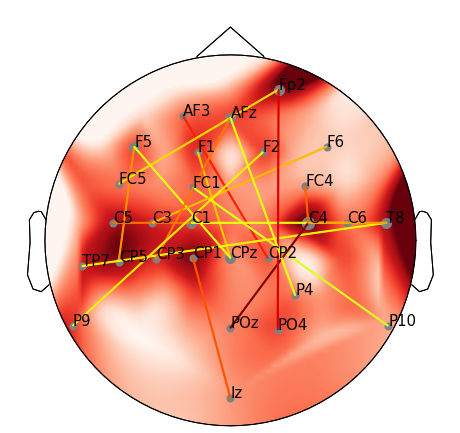

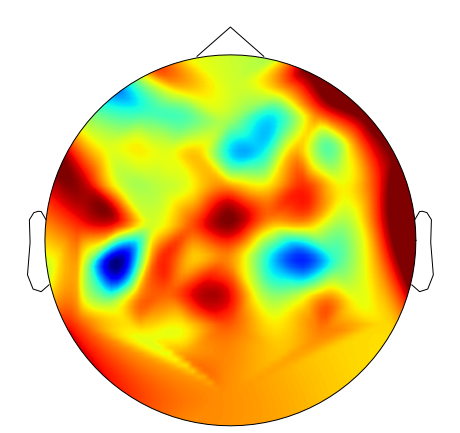

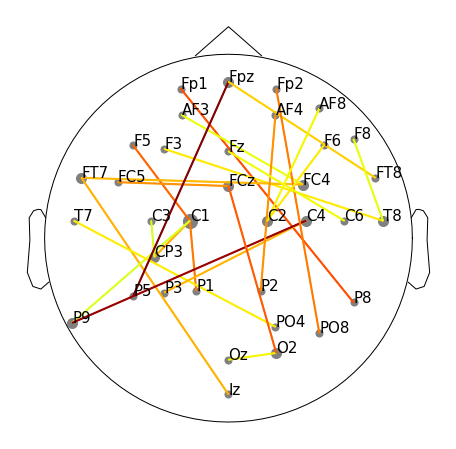

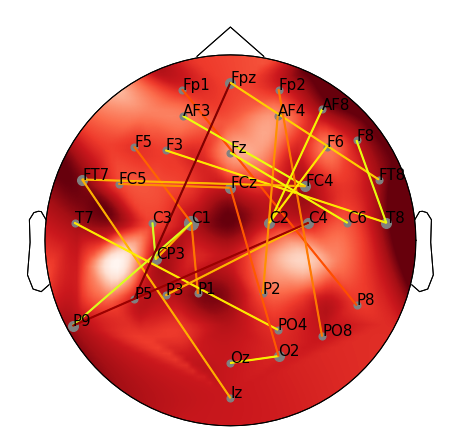

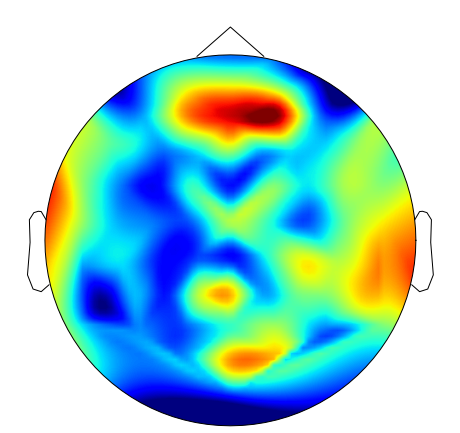

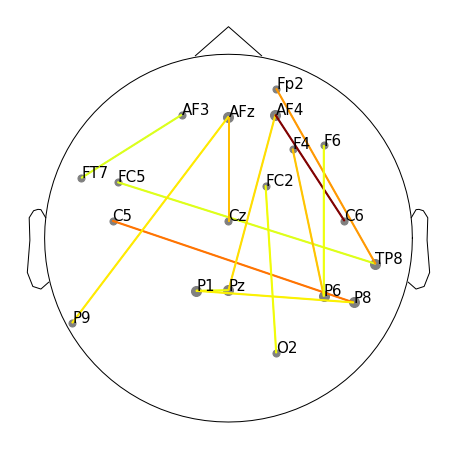

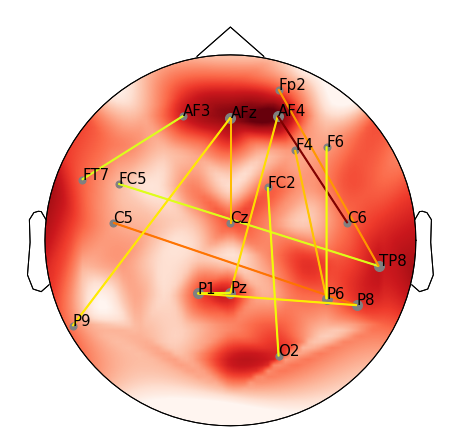

run:  4
Epoch 1/200
1/1 [==============================] - 1s 972ms/step - loss: 7.0166 - val_loss: 8.0538
Epoch 2/200
1/1 [==============================] - 0s 86ms/step - loss: 6.9548 - val_loss: 8.0927
Epoch 3/200
1/1 [==============================] - 0s 85ms/step - loss: 6.7272 - val_loss: 8.1363
Epoch 4/200
1/1 [==============================] - 0s 86ms/step - loss: 6.6997 - val_loss: 7.9020
Epoch 5/200
1/1 [==============================] - 0s 78ms/step - loss: 6.6759 - val_loss: 7.7693
Epoch 6/200
1/1 [==============================] - 0s 84ms/step - loss: 6.6529 - val_loss: 7.7796
Epoch 7/200
1/1 [==============================] - 0s 80ms/step - loss: 6.6921 - val_loss: 7.9000
Epoch 8/200
1/1 [==============================] - 0s 78ms/step - loss: 6.7134 - val_loss: 7.8678
Epoch 9/200
1/1 [==============================] - 0s 76ms/step - loss: 6.7569 - val_loss: 7.7636
Epoch 10/200
1/1 [==============================] - 0s 81ms/step - loss: 6.6379 - val_loss: 7.8422
Epoch 11/2

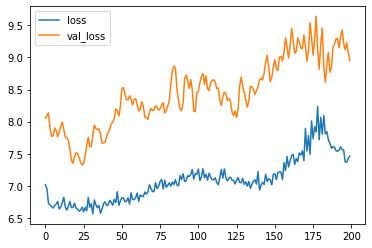

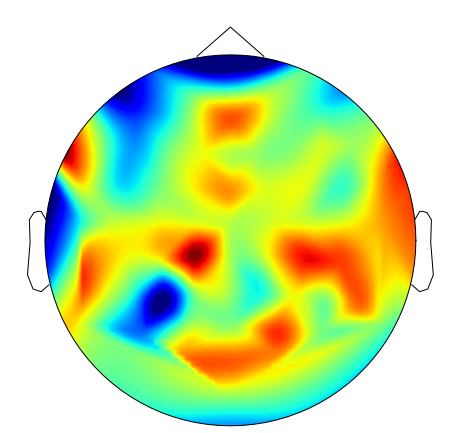

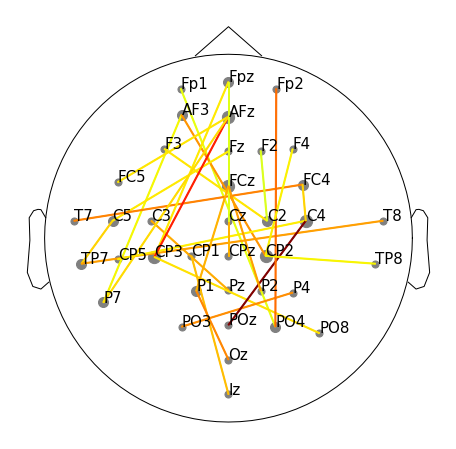

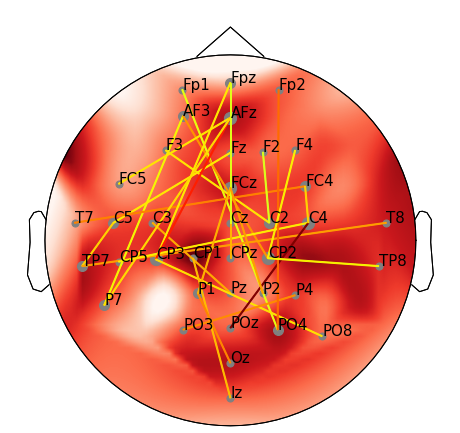

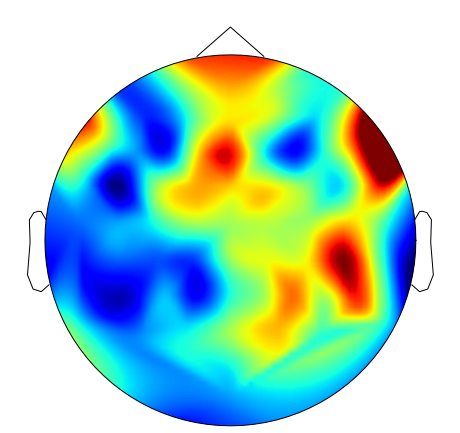

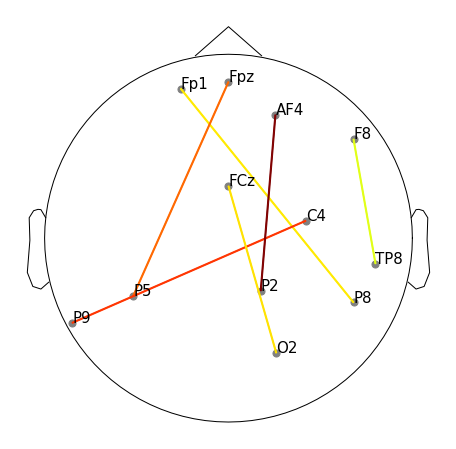

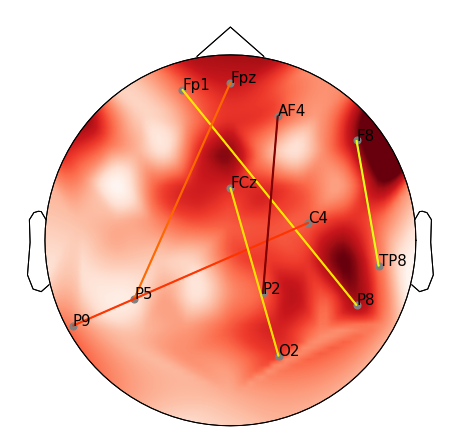

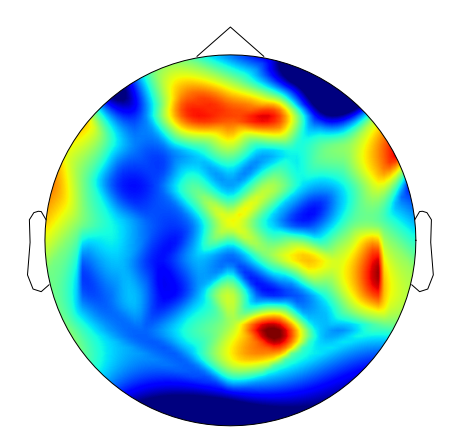

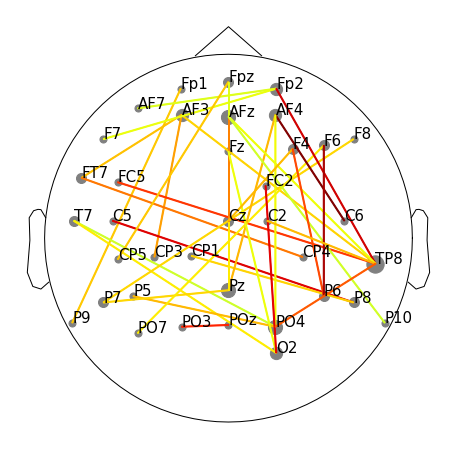

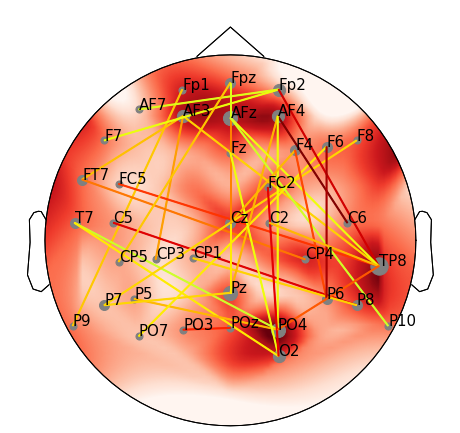

run:  5
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 7.7781 - val_loss: 9.8053
Epoch 2/200
1/1 [==============================] - 0s 85ms/step - loss: 7.5709 - val_loss: 9.8309
Epoch 3/200
1/1 [==============================] - 0s 79ms/step - loss: 7.4271 - val_loss: 9.8366
Epoch 4/200
1/1 [==============================] - 0s 81ms/step - loss: 7.4442 - val_loss: 9.6917
Epoch 5/200
1/1 [==============================] - 0s 81ms/step - loss: 7.2433 - val_loss: 9.7734
Epoch 6/200
1/1 [==============================] - 0s 79ms/step - loss: 7.4591 - val_loss: 9.8036
Epoch 7/200
1/1 [==============================] - 0s 81ms/step - loss: 7.4781 - val_loss: 9.7229
Epoch 8/200
1/1 [==============================] - 0s 79ms/step - loss: 7.3700 - val_loss: 9.5029
Epoch 9/200
1/1 [==============================] - 0s 81ms/step - loss: 7.3779 - val_loss: 9.4154
Epoch 10/200
1/1 [==============================] - 0s 78ms/step - loss: 7.2789 - val_loss: 9.3335
Epoch 11/200


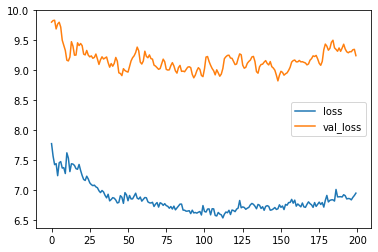

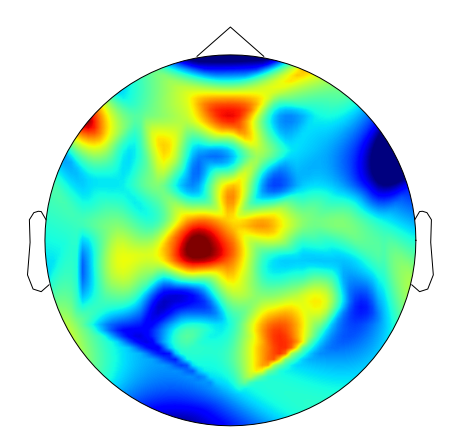

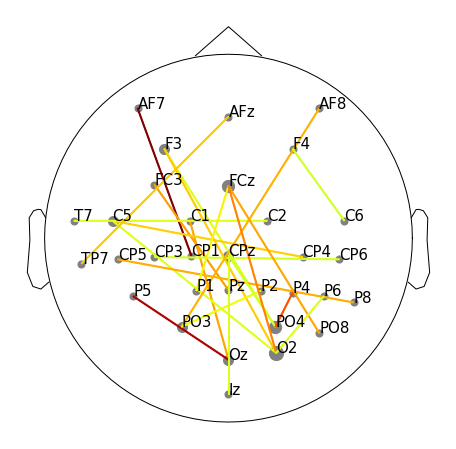

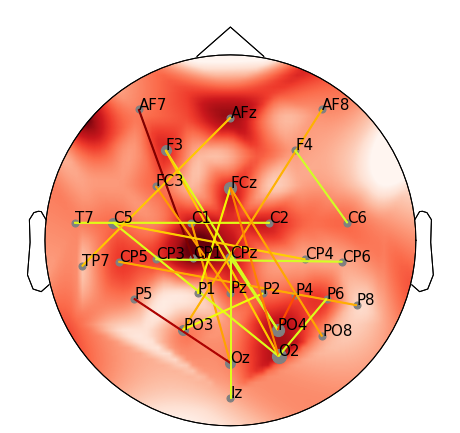

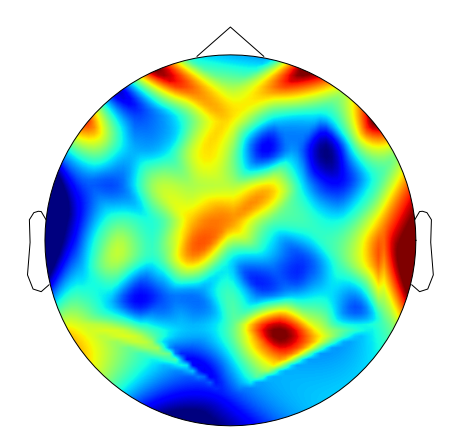

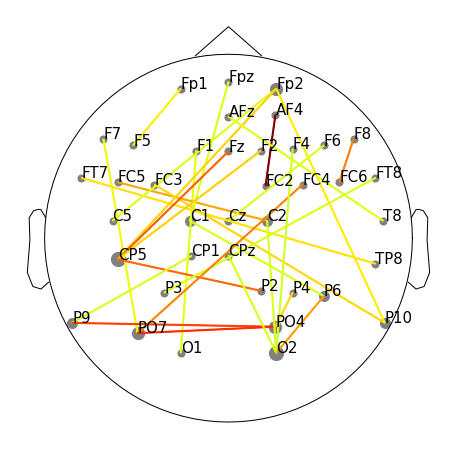

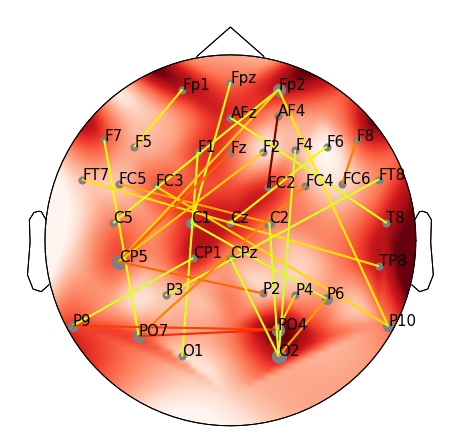

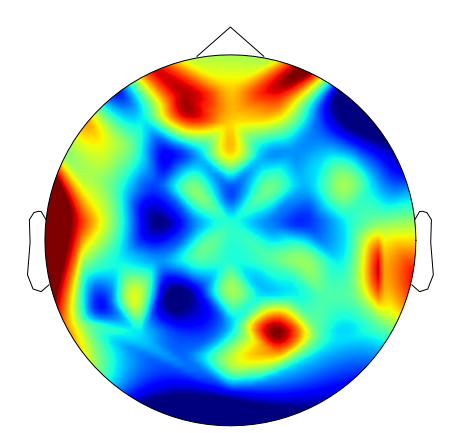

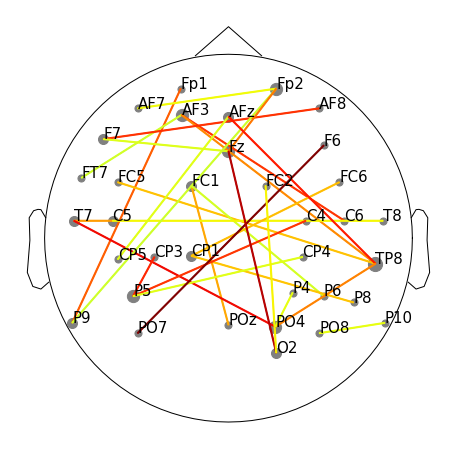

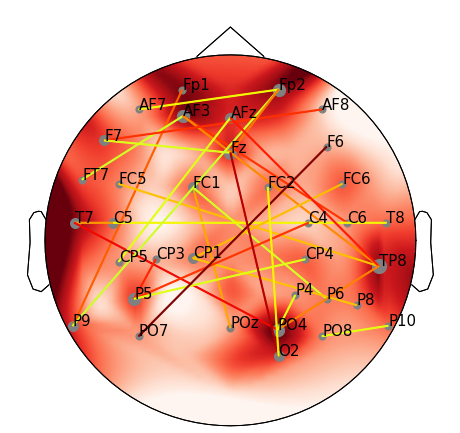

grupos:  [0, None, None]
run:  1
Epoch 1/200
1/1 [==============================] - 1s 939ms/step - loss: 724.2377 - val_loss: 721.4656
Epoch 2/200
1/1 [==============================] - 0s 81ms/step - loss: 740.2930 - val_loss: 683.0884
Epoch 3/200
1/1 [==============================] - 0s 79ms/step - loss: 686.0469 - val_loss: 694.8624
Epoch 4/200
1/1 [==============================] - 0s 77ms/step - loss: 692.9834 - val_loss: 675.3758
Epoch 5/200
1/1 [==============================] - 0s 83ms/step - loss: 665.7335 - val_loss: 645.7363
Epoch 6/200
1/1 [==============================] - 0s 80ms/step - loss: 635.3220 - val_loss: 614.0270
Epoch 7/200
1/1 [==============================] - 0s 203ms/step - loss: 607.1274 - val_loss: 584.0823
Epoch 8/200
1/1 [==============================] - 0s 78ms/step - loss: 581.1923 - val_loss: 557.3988
Epoch 9/200
1/1 [==============================] - 0s 77ms/step - loss: 556.3445 - val_loss: 535.6730
Epoch 10/200
1/1 [=============================

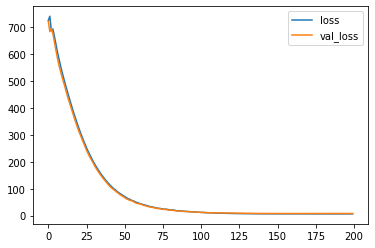

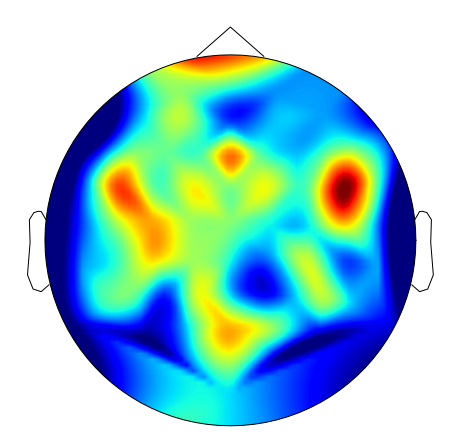

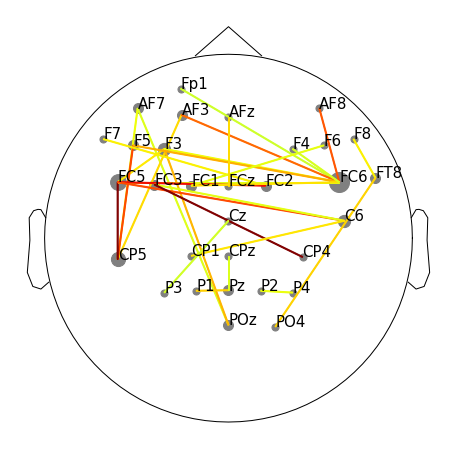

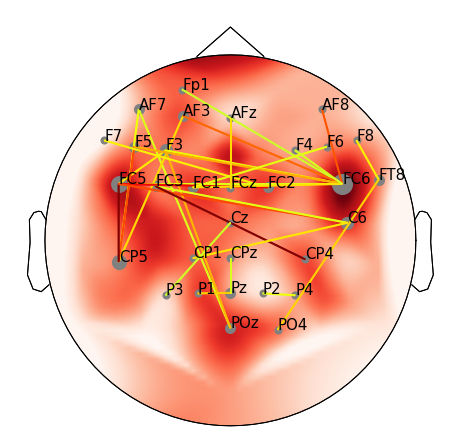

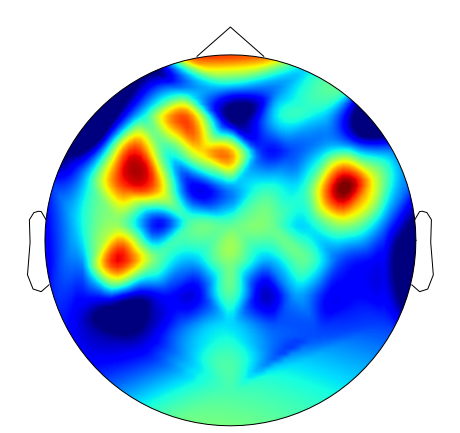

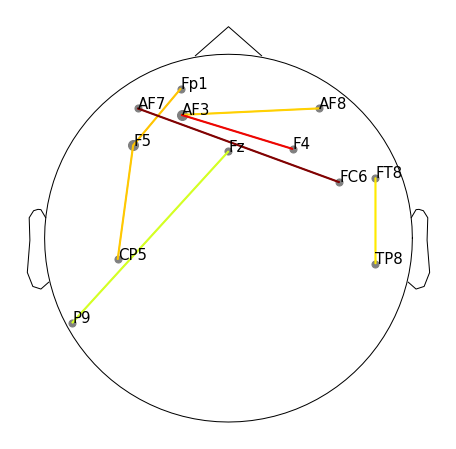

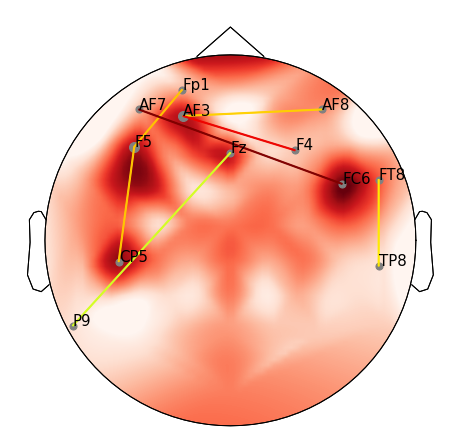

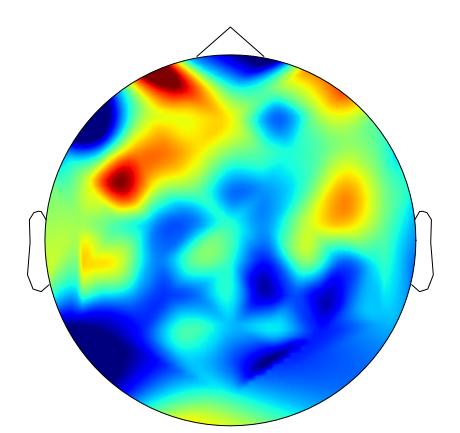

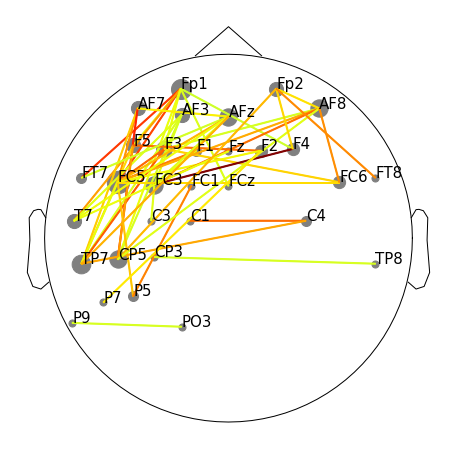

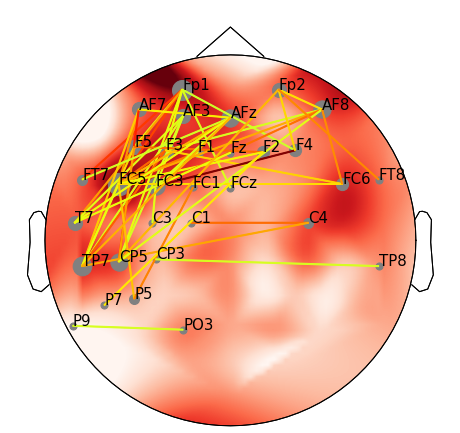

run:  2
Epoch 1/200
1/1 [==============================] - 1s 984ms/step - loss: 7.2028 - val_loss: 7.2235
Epoch 2/200
1/1 [==============================] - 0s 82ms/step - loss: 7.0236 - val_loss: 7.1877
Epoch 3/200
1/1 [==============================] - 0s 244ms/step - loss: 6.9680 - val_loss: 7.1866
Epoch 4/200
1/1 [==============================] - 0s 78ms/step - loss: 6.8969 - val_loss: 7.2566
Epoch 5/200
1/1 [==============================] - 0s 78ms/step - loss: 6.7596 - val_loss: 7.4150
Epoch 6/200
1/1 [==============================] - 0s 82ms/step - loss: 6.7496 - val_loss: 7.5042
Epoch 7/200
1/1 [==============================] - 0s 81ms/step - loss: 6.8252 - val_loss: 7.5366
Epoch 8/200
1/1 [==============================] - 0s 82ms/step - loss: 6.6987 - val_loss: 7.5875
Epoch 9/200
1/1 [==============================] - 0s 83ms/step - loss: 6.6925 - val_loss: 7.6283
Epoch 10/200
1/1 [==============================] - 0s 82ms/step - loss: 6.7425 - val_loss: 7.7436
Epoch 11/

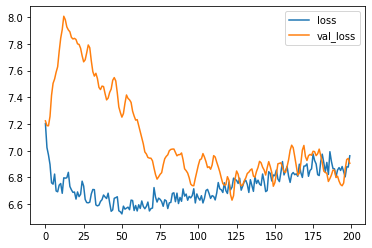

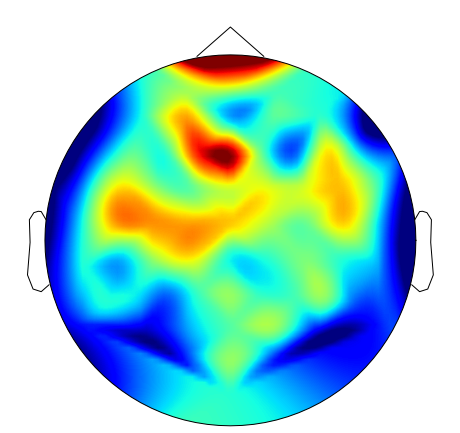

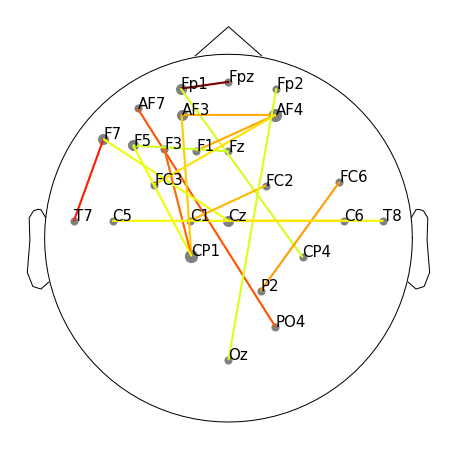

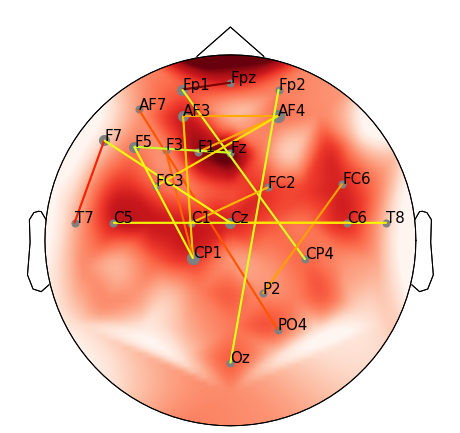

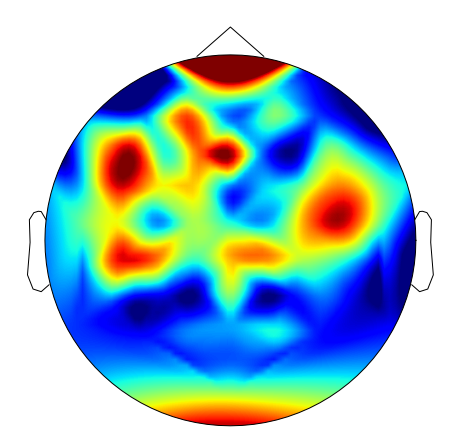

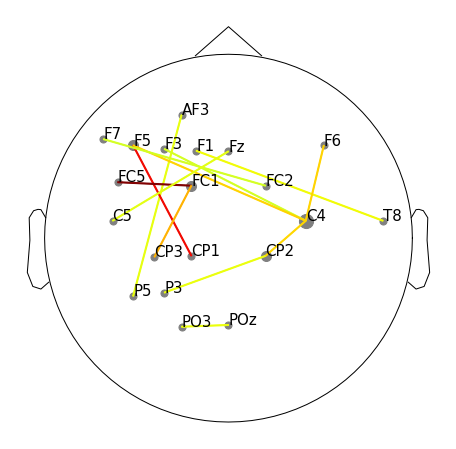

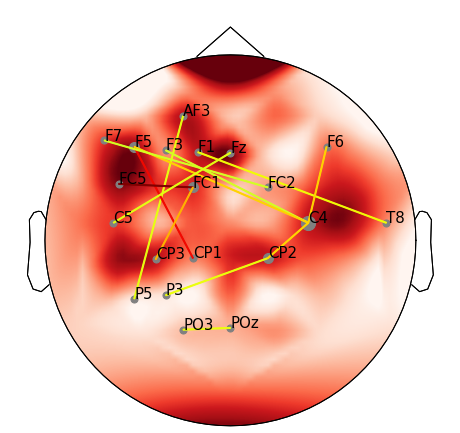

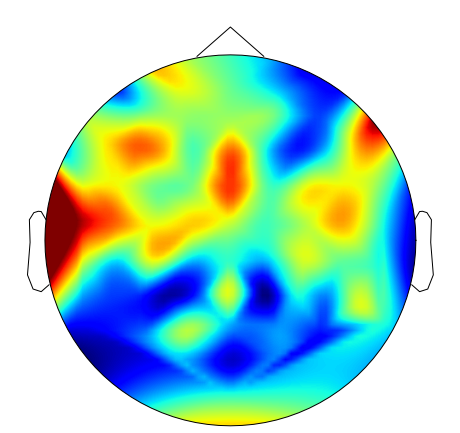

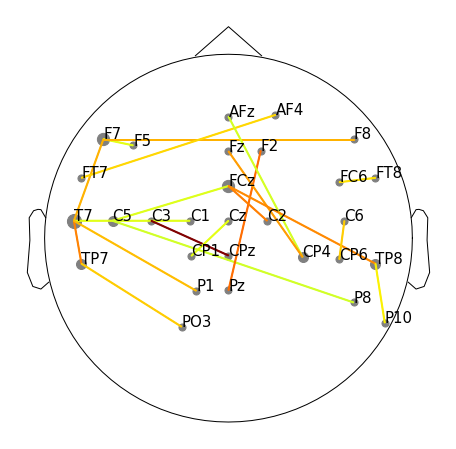

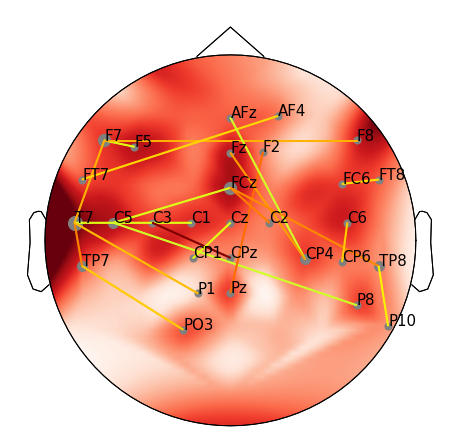

run:  3
Epoch 1/200
1/1 [==============================] - 1s 972ms/step - loss: 7.6749 - val_loss: 7.6472
Epoch 2/200
1/1 [==============================] - 0s 81ms/step - loss: 7.6403 - val_loss: 7.6626
Epoch 3/200
1/1 [==============================] - 0s 78ms/step - loss: 7.5752 - val_loss: 7.6442
Epoch 4/200
1/1 [==============================] - 0s 77ms/step - loss: 7.2995 - val_loss: 7.6067
Epoch 5/200
1/1 [==============================] - 0s 86ms/step - loss: 7.3034 - val_loss: 7.5840
Epoch 6/200
1/1 [==============================] - 0s 76ms/step - loss: 7.1292 - val_loss: 7.6685
Epoch 7/200
1/1 [==============================] - 0s 76ms/step - loss: 7.0719 - val_loss: 7.8242
Epoch 8/200
1/1 [==============================] - 0s 80ms/step - loss: 7.1619 - val_loss: 7.8157
Epoch 9/200
1/1 [==============================] - 0s 77ms/step - loss: 7.1555 - val_loss: 7.8483
Epoch 10/200
1/1 [==============================] - 0s 77ms/step - loss: 7.1062 - val_loss: 7.9189
Epoch 11/2

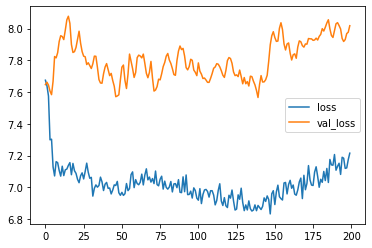

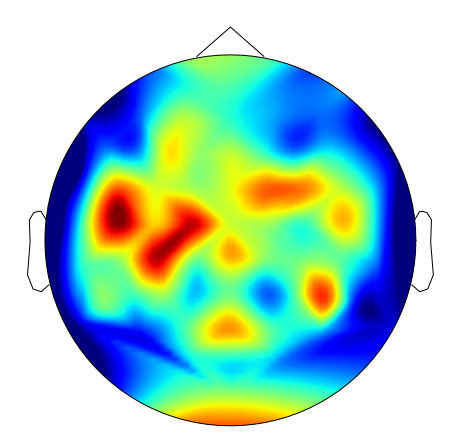

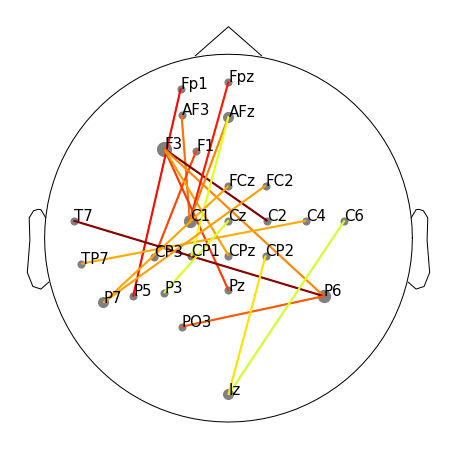

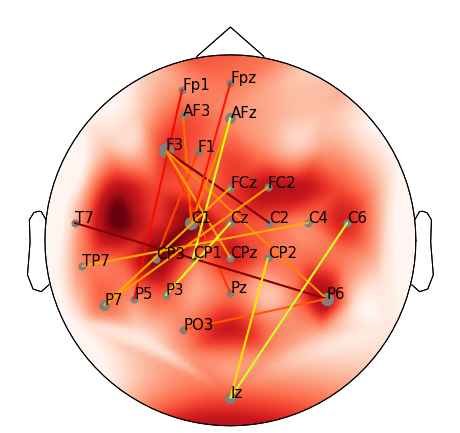

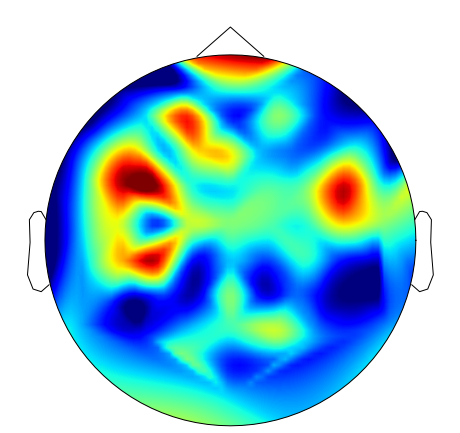

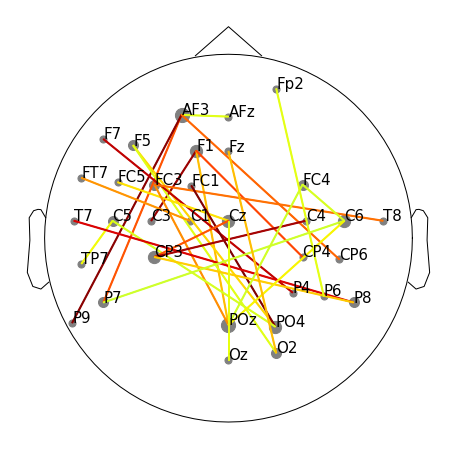

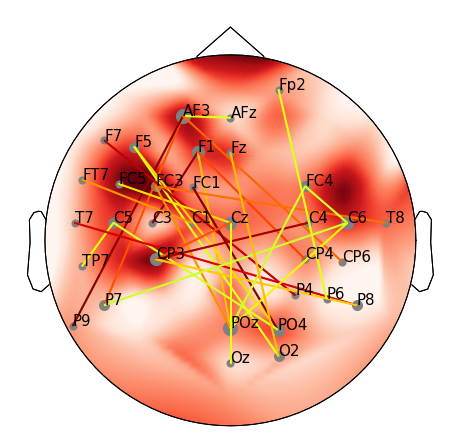

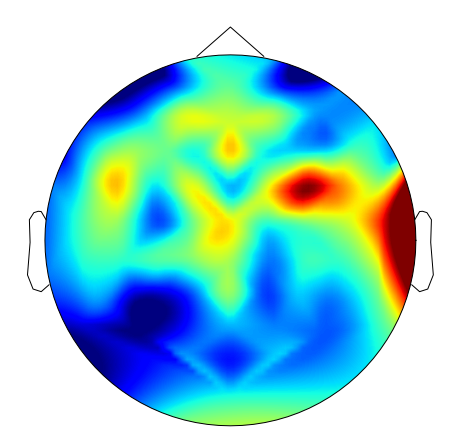

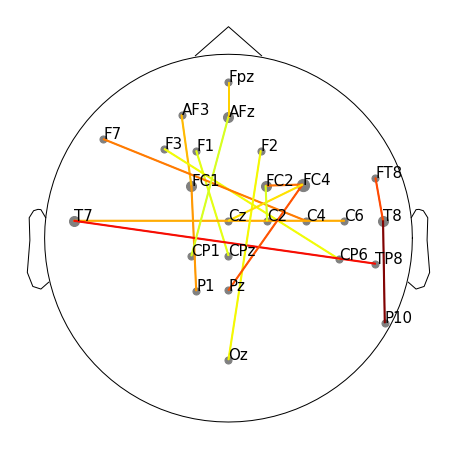

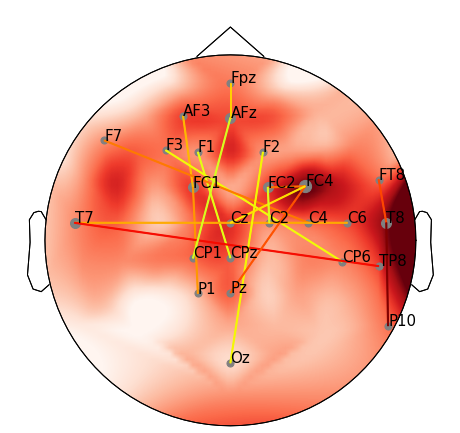

run:  4
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 7.8395 - val_loss: 7.6253
Epoch 2/200
1/1 [==============================] - 0s 87ms/step - loss: 7.6761 - val_loss: 7.6195
Epoch 3/200
1/1 [==============================] - 0s 79ms/step - loss: 7.4607 - val_loss: 7.6584
Epoch 4/200
1/1 [==============================] - 0s 81ms/step - loss: 7.5009 - val_loss: 7.7327
Epoch 5/200
1/1 [==============================] - 0s 77ms/step - loss: 7.4903 - val_loss: 7.8208
Epoch 6/200
1/1 [==============================] - 0s 76ms/step - loss: 7.5221 - val_loss: 7.8601
Epoch 7/200
1/1 [==============================] - 0s 79ms/step - loss: 7.3685 - val_loss: 7.9924
Epoch 8/200
1/1 [==============================] - 0s 75ms/step - loss: 7.4848 - val_loss: 8.1530
Epoch 9/200
1/1 [==============================] - 0s 75ms/step - loss: 7.3796 - val_loss: 8.3163
Epoch 10/200
1/1 [==============================] - 0s 77ms/step - loss: 7.5046 - val_loss: 8.3564
Epoch 11/200


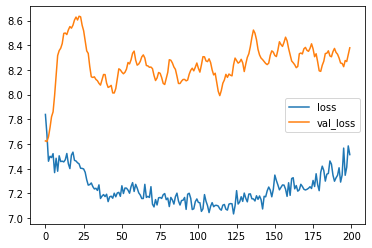

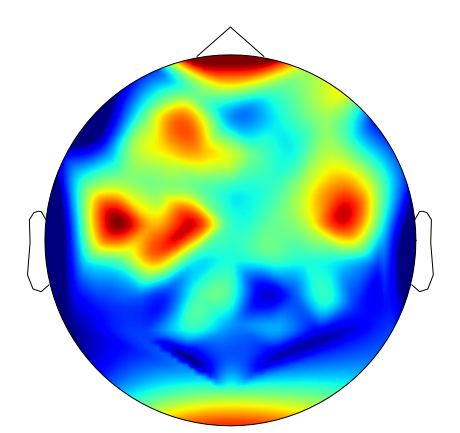

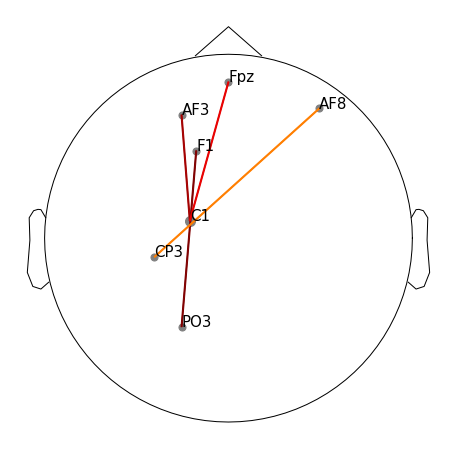

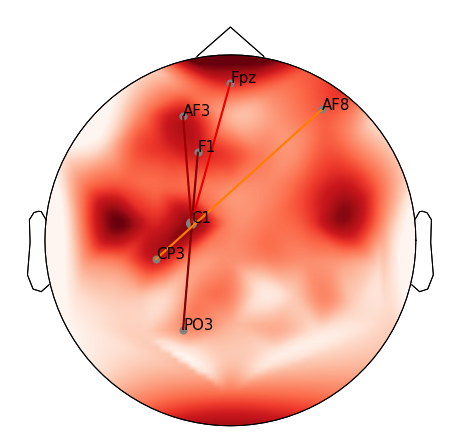

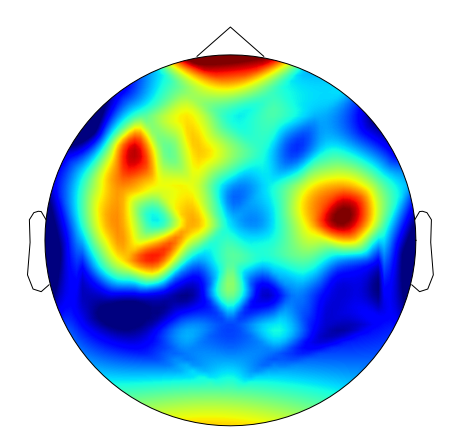

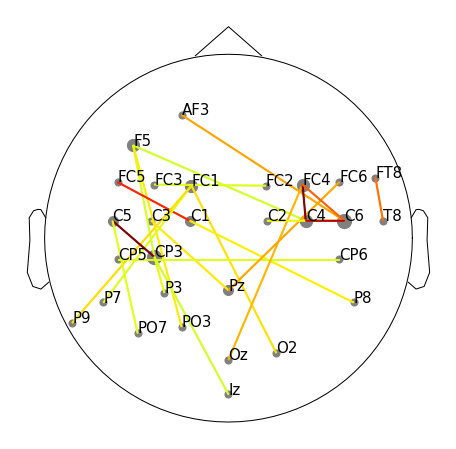

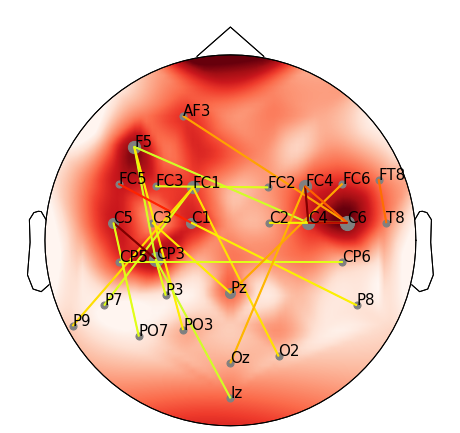

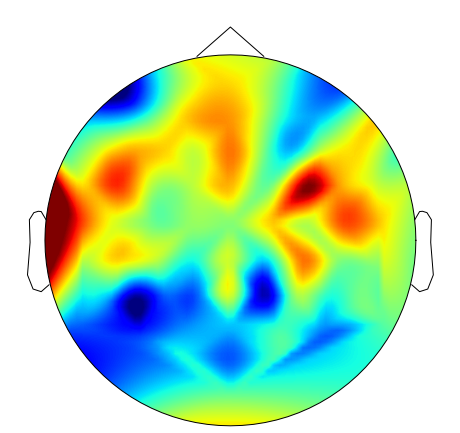

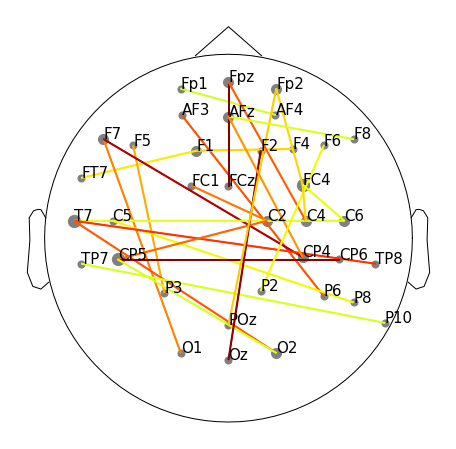

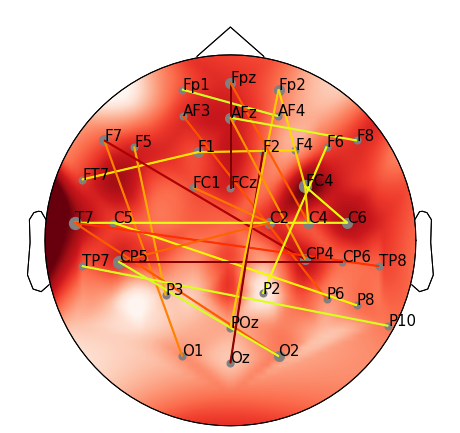

run:  5
Epoch 1/200
1/1 [==============================] - 1s 975ms/step - loss: 8.1418 - val_loss: 8.0307
Epoch 2/200
1/1 [==============================] - 0s 83ms/step - loss: 8.1222 - val_loss: 8.0248
Epoch 3/200
1/1 [==============================] - 0s 80ms/step - loss: 7.8979 - val_loss: 8.0952
Epoch 4/200
1/1 [==============================] - 0s 79ms/step - loss: 7.8716 - val_loss: 8.2061
Epoch 5/200
1/1 [==============================] - 0s 80ms/step - loss: 7.6693 - val_loss: 8.3665
Epoch 6/200
1/1 [==============================] - 0s 79ms/step - loss: 7.7799 - val_loss: 8.4886
Epoch 7/200
1/1 [==============================] - 0s 80ms/step - loss: 7.7329 - val_loss: 8.5612
Epoch 8/200
1/1 [==============================] - 0s 80ms/step - loss: 7.7219 - val_loss: 8.5893
Epoch 9/200
1/1 [==============================] - 0s 79ms/step - loss: 7.7305 - val_loss: 8.6387
Epoch 10/200
1/1 [==============================] - 0s 202ms/step - loss: 7.6247 - val_loss: 8.7688
Epoch 11/

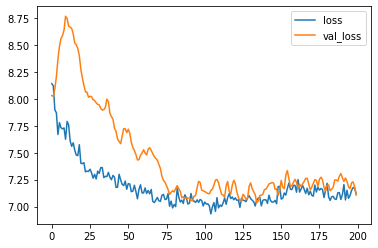

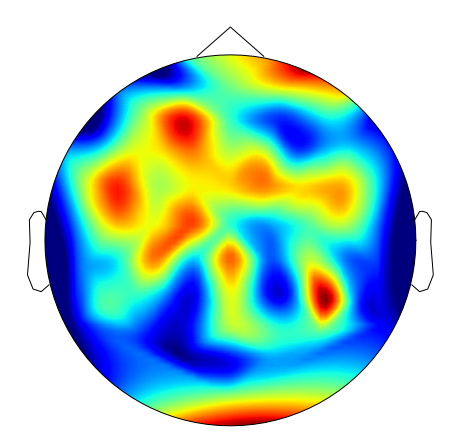

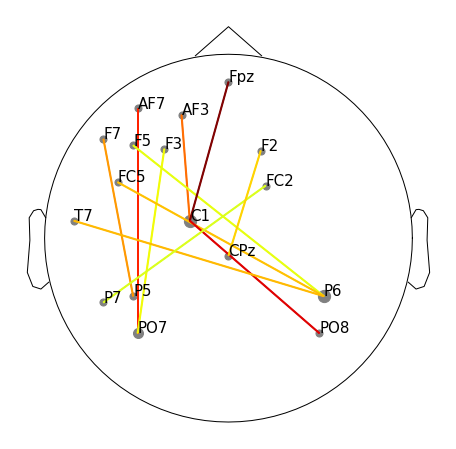

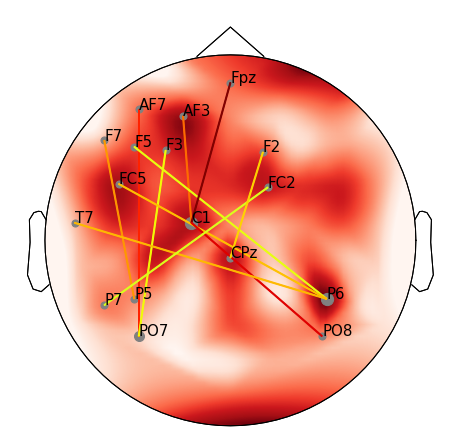

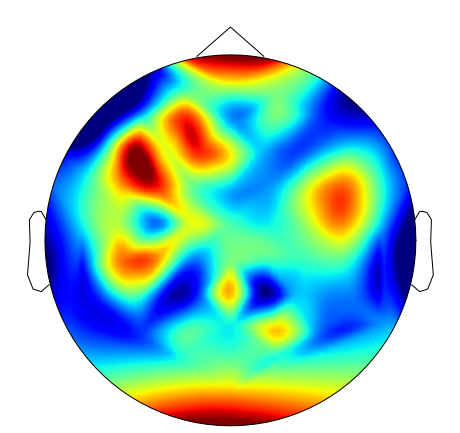

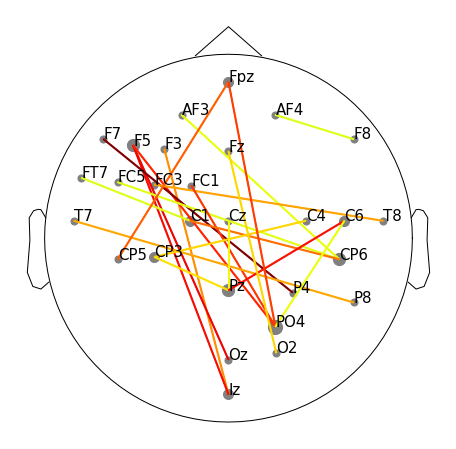

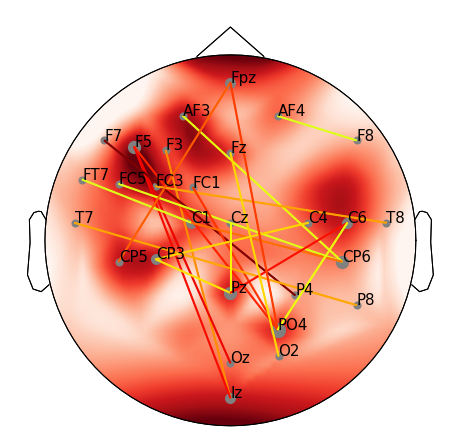

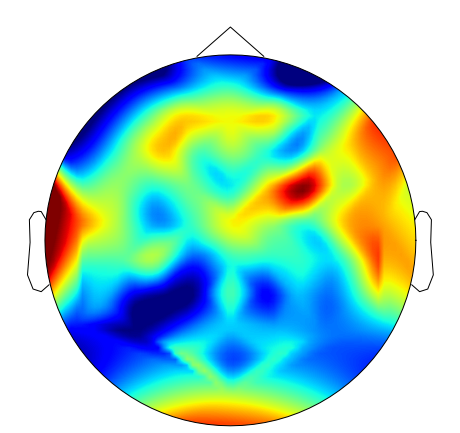

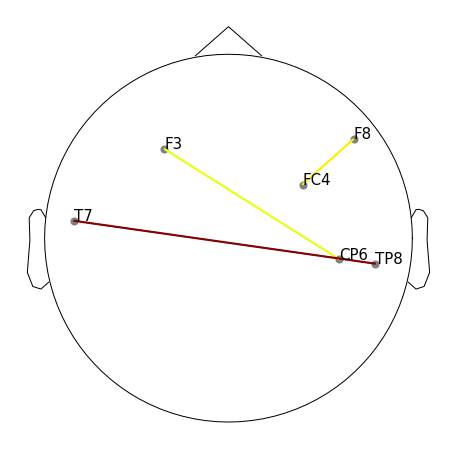

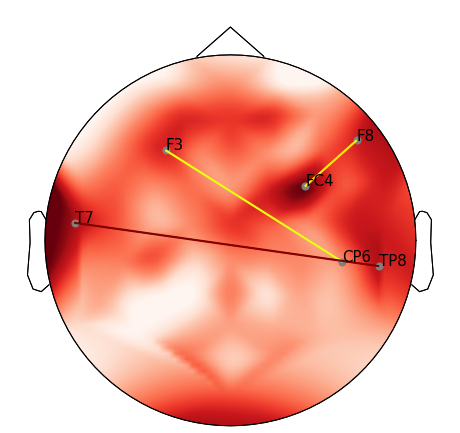

grupos:  [1, None, None]
run:  1
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 723.9473 - val_loss: 699.7249
Epoch 2/200
1/1 [==============================] - 0s 81ms/step - loss: 724.2960 - val_loss: 669.9012
Epoch 3/200
1/1 [==============================] - 0s 79ms/step - loss: 671.3638 - val_loss: 653.4625
Epoch 4/200
1/1 [==============================] - 0s 77ms/step - loss: 673.2234 - val_loss: 630.5157
Epoch 5/200
1/1 [==============================] - 0s 78ms/step - loss: 641.2831 - val_loss: 603.2178
Epoch 6/200
1/1 [==============================] - 0s 78ms/step - loss: 607.9191 - val_loss: 576.8306
Epoch 7/200
1/1 [==============================] - 0s 78ms/step - loss: 580.6646 - val_loss: 551.7675
Epoch 8/200
1/1 [==============================] - 0s 77ms/step - loss: 552.8871 - val_loss: 527.2115
Epoch 9/200
1/1 [==============================] - 0s 79ms/step - loss: 527.4547 - val_loss: 503.9101
Epoch 10/200
1/1 [==============================] -

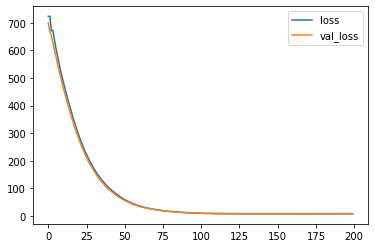

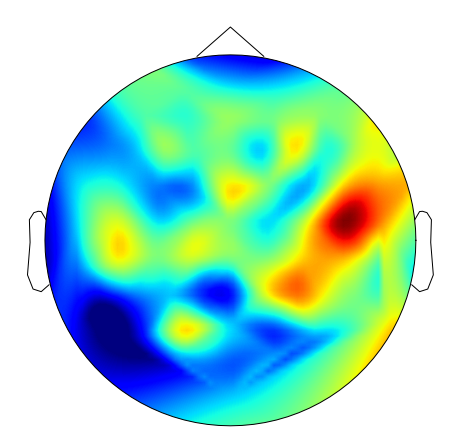

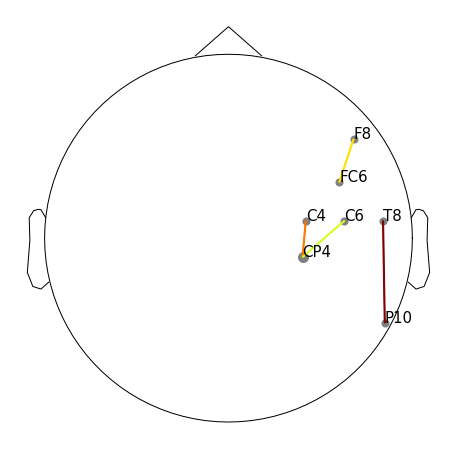

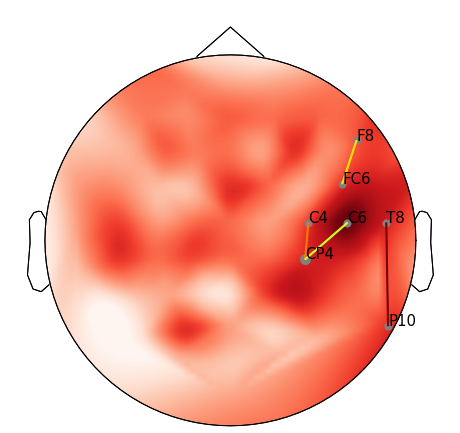

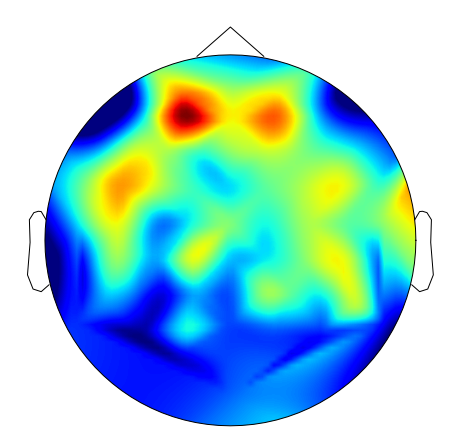

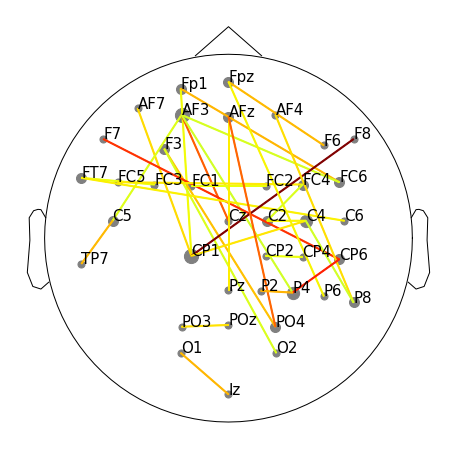

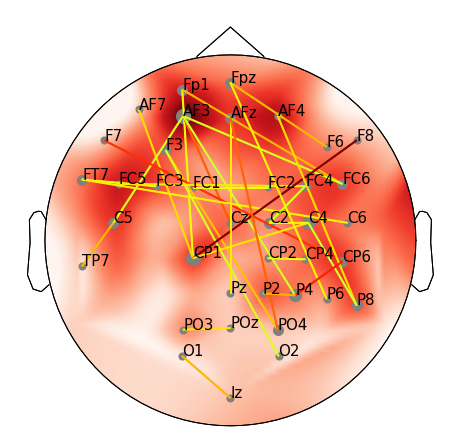

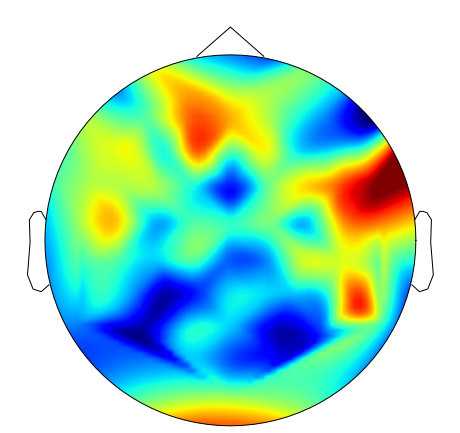

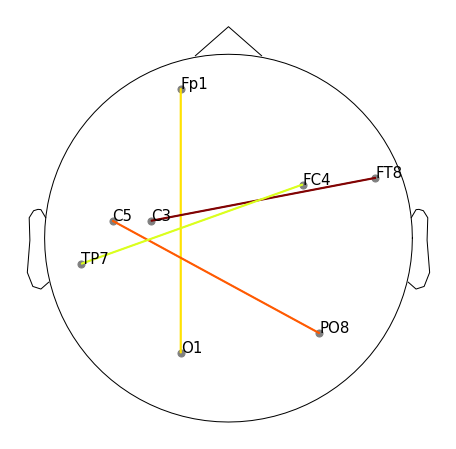

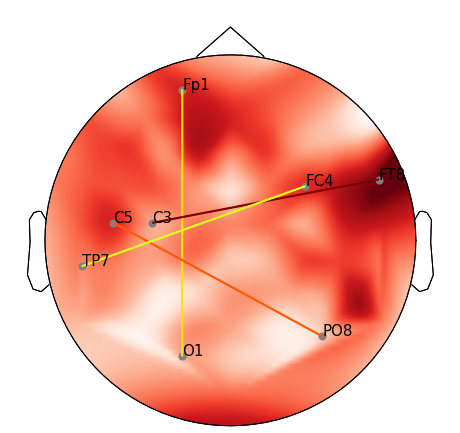

run:  2
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 7.7696 - val_loss: 7.5917
Epoch 2/200
1/1 [==============================] - 0s 81ms/step - loss: 7.5959 - val_loss: 7.6465
Epoch 3/200
1/1 [==============================] - 0s 80ms/step - loss: 7.5165 - val_loss: 7.6556
Epoch 4/200
1/1 [==============================] - 0s 82ms/step - loss: 7.4575 - val_loss: 7.7055
Epoch 5/200
1/1 [==============================] - 0s 82ms/step - loss: 7.3784 - val_loss: 7.8399
Epoch 6/200
1/1 [==============================] - 0s 79ms/step - loss: 7.4031 - val_loss: 7.8927
Epoch 7/200
1/1 [==============================] - 0s 84ms/step - loss: 7.3538 - val_loss: 7.9328
Epoch 8/200
1/1 [==============================] - 0s 78ms/step - loss: 7.3432 - val_loss: 7.9903
Epoch 9/200
1/1 [==============================] - 0s 77ms/step - loss: 7.3333 - val_loss: 8.0781
Epoch 10/200
1/1 [==============================] - 0s 76ms/step - loss: 7.3620 - val_loss: 8.0517
Epoch 11/200


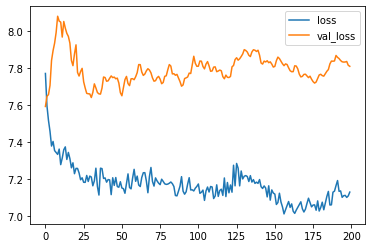

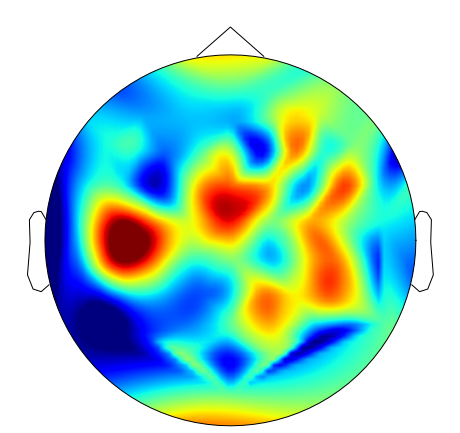

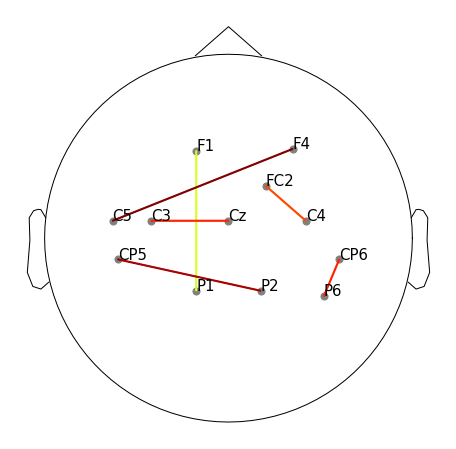

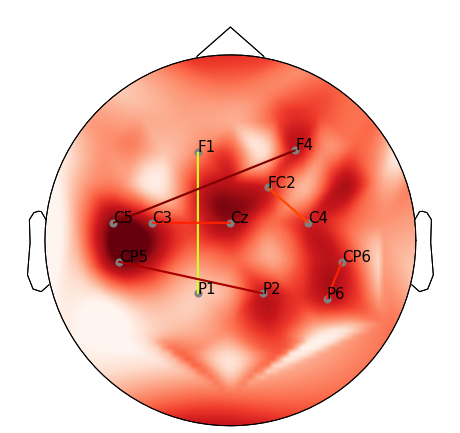

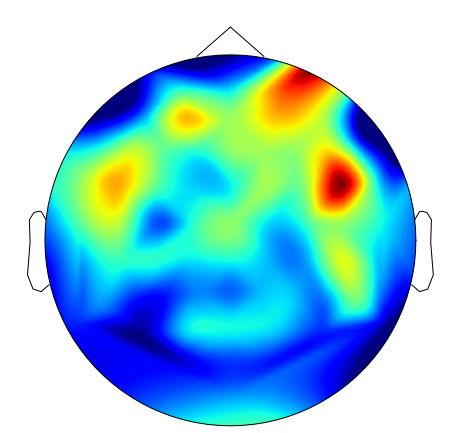

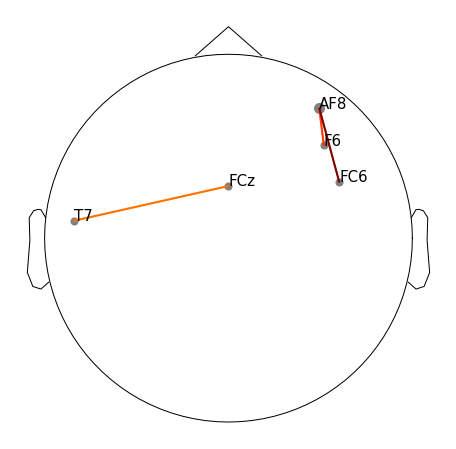

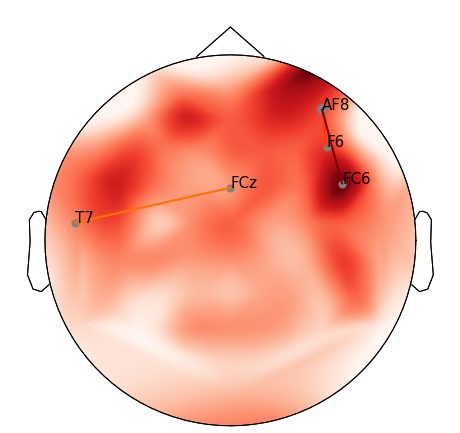

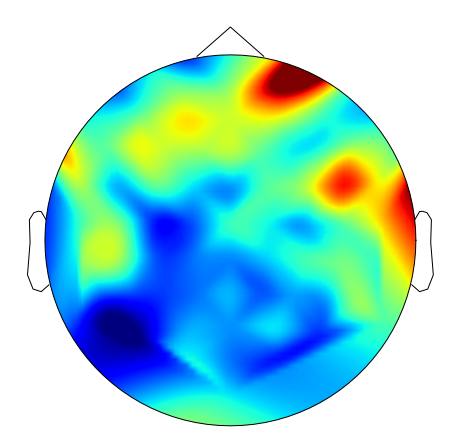

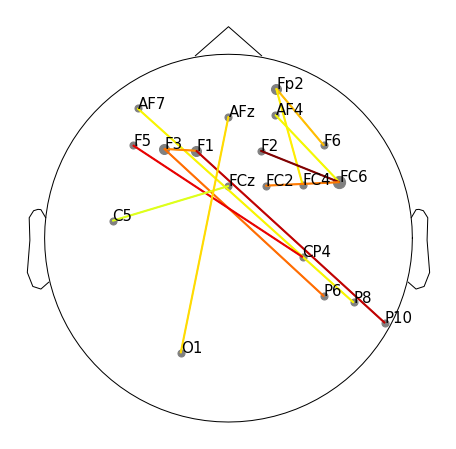

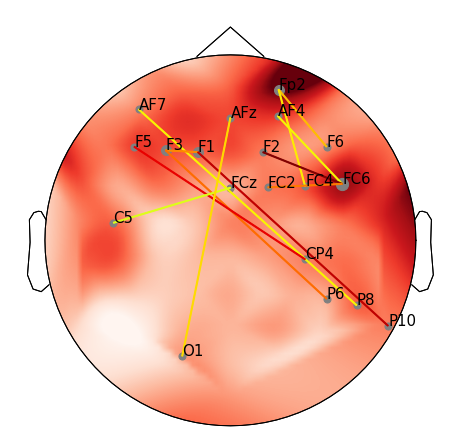

run:  3
Epoch 1/200
1/1 [==============================] - 1s 987ms/step - loss: 8.0417 - val_loss: 7.4734
Epoch 2/200
1/1 [==============================] - 0s 82ms/step - loss: 7.9696 - val_loss: 7.4578
Epoch 3/200
1/1 [==============================] - 0s 77ms/step - loss: 7.7557 - val_loss: 7.4339
Epoch 4/200
1/1 [==============================] - 0s 80ms/step - loss: 7.6039 - val_loss: 7.4362
Epoch 5/200
1/1 [==============================] - 0s 80ms/step - loss: 7.5391 - val_loss: 7.4564
Epoch 6/200
1/1 [==============================] - 0s 78ms/step - loss: 7.4779 - val_loss: 7.4905
Epoch 7/200
1/1 [==============================] - 0s 76ms/step - loss: 7.4155 - val_loss: 7.5954
Epoch 8/200
1/1 [==============================] - 0s 78ms/step - loss: 7.3871 - val_loss: 7.6494
Epoch 9/200
1/1 [==============================] - 0s 208ms/step - loss: 7.3953 - val_loss: 7.6634
Epoch 10/200
1/1 [==============================] - 0s 81ms/step - loss: 7.4247 - val_loss: 7.6872
Epoch 11/

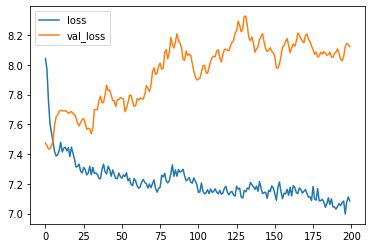

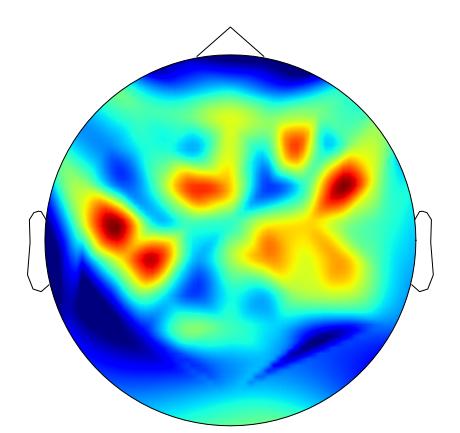

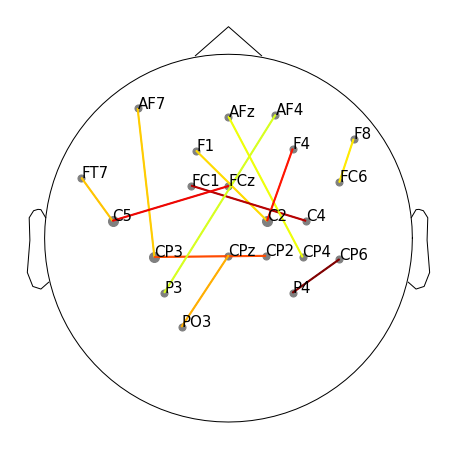

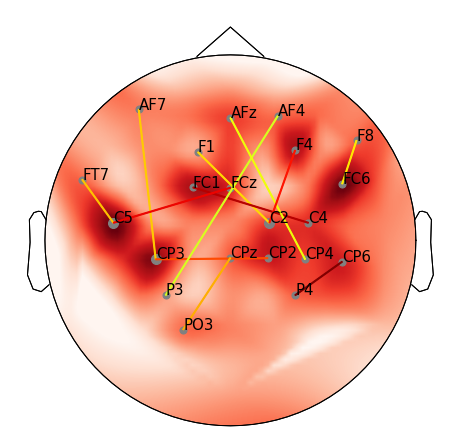

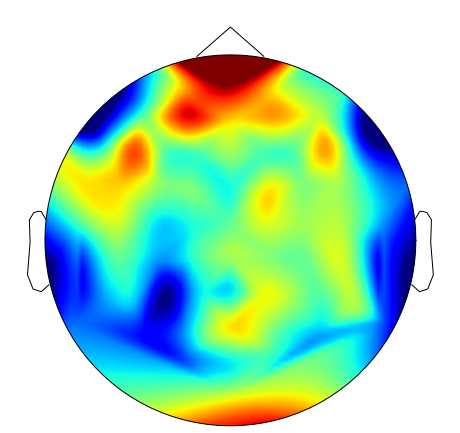

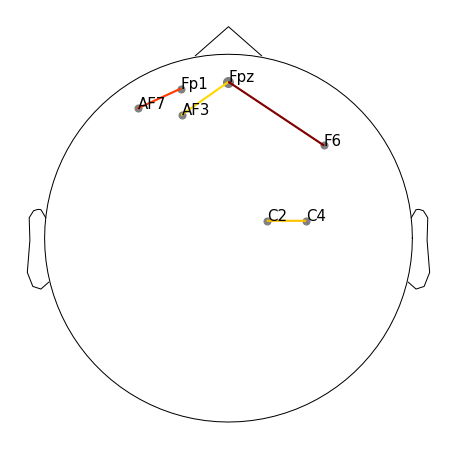

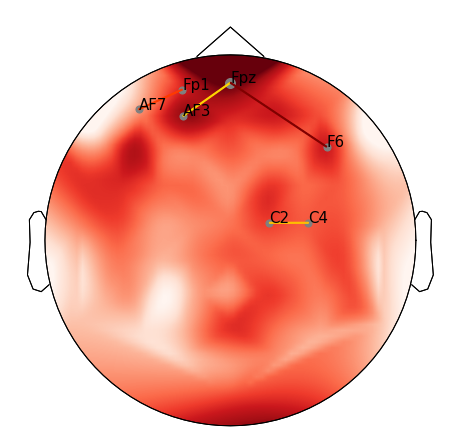

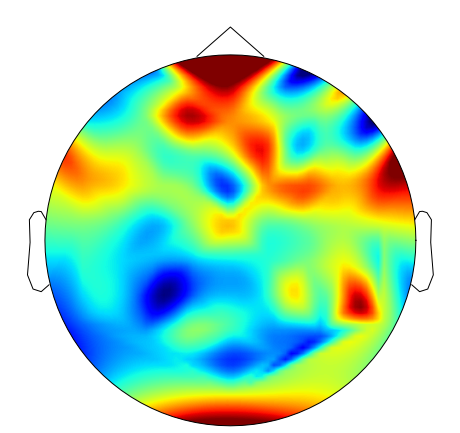

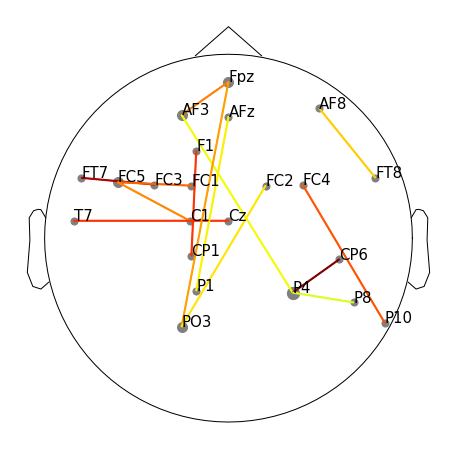

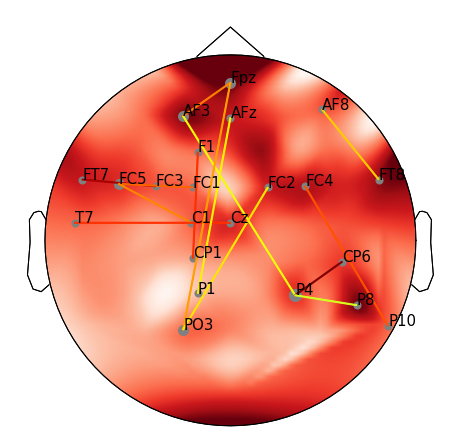

run:  4
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 7.6538 - val_loss: 7.9094
Epoch 2/200
1/1 [==============================] - 0s 81ms/step - loss: 7.5942 - val_loss: 7.9055
Epoch 3/200
1/1 [==============================] - 0s 80ms/step - loss: 7.5130 - val_loss: 7.9176
Epoch 4/200
1/1 [==============================] - 0s 78ms/step - loss: 7.3899 - val_loss: 7.9609
Epoch 5/200
1/1 [==============================] - 0s 78ms/step - loss: 7.3494 - val_loss: 8.0198
Epoch 6/200
1/1 [==============================] - 0s 78ms/step - loss: 7.3183 - val_loss: 8.0311
Epoch 7/200
1/1 [==============================] - 0s 81ms/step - loss: 7.3179 - val_loss: 8.0426
Epoch 8/200
1/1 [==============================] - 0s 77ms/step - loss: 7.2892 - val_loss: 8.0122
Epoch 9/200
1/1 [==============================] - 0s 88ms/step - loss: 7.2624 - val_loss: 8.0059
Epoch 10/200
1/1 [==============================] - 0s 77ms/step - loss: 7.2787 - val_loss: 8.0141
Epoch 11/200


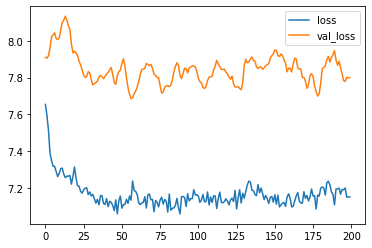

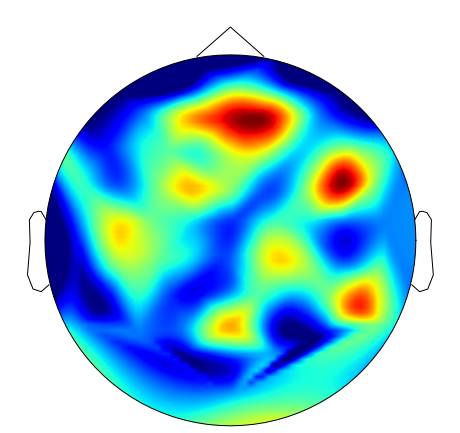

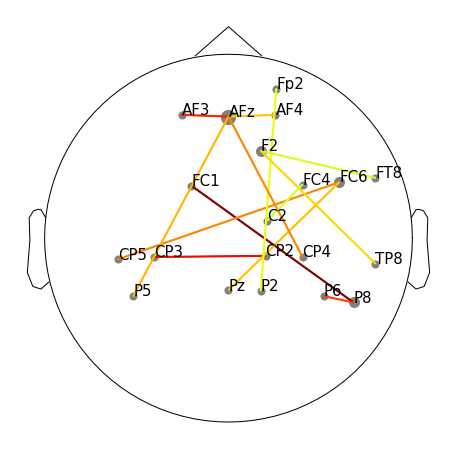

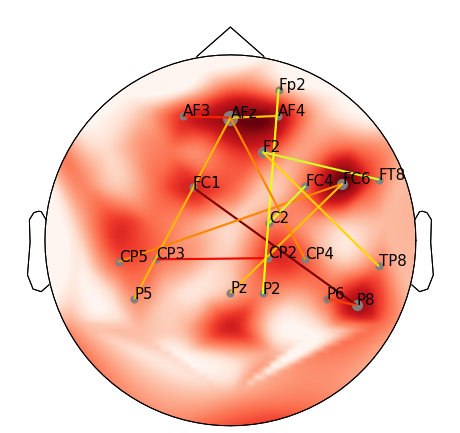

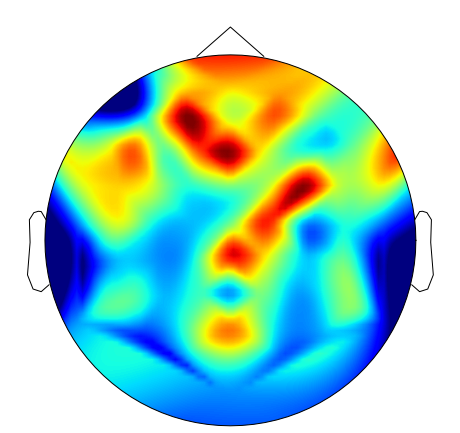

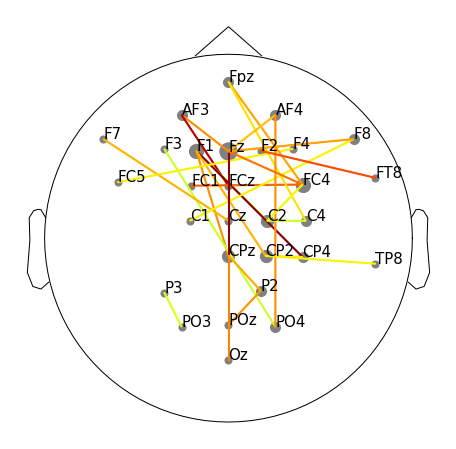

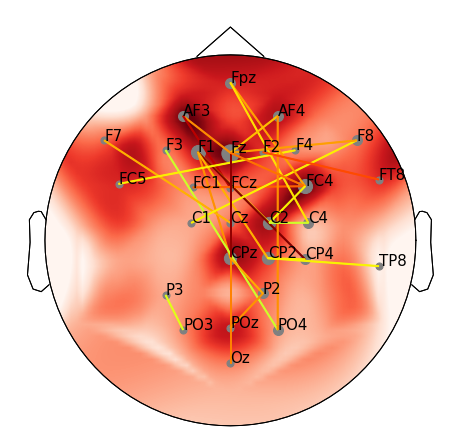

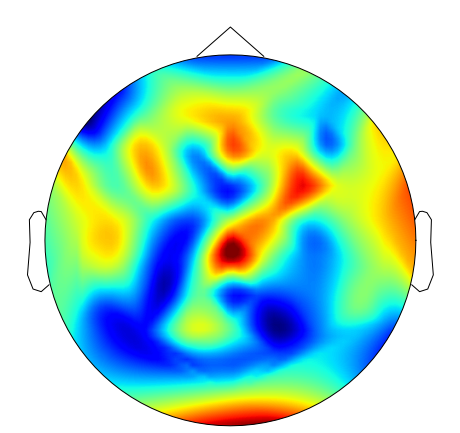

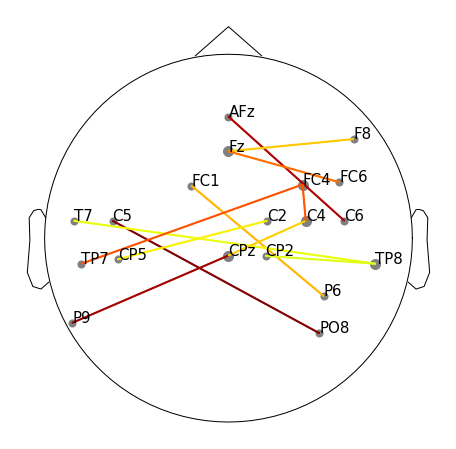

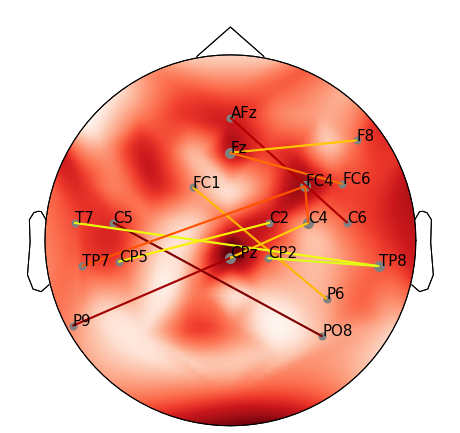

run:  5
Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 8.2844 - val_loss: 7.9506
Epoch 2/200
1/1 [==============================] - 0s 80ms/step - loss: 8.1961 - val_loss: 7.9419
Epoch 3/200
1/1 [==============================] - 0s 78ms/step - loss: 7.9830 - val_loss: 7.9533
Epoch 4/200
1/1 [==============================] - 0s 79ms/step - loss: 7.7688 - val_loss: 8.0421
Epoch 5/200
1/1 [==============================] - 0s 78ms/step - loss: 7.5382 - val_loss: 8.1891
Epoch 6/200
1/1 [==============================] - 0s 77ms/step - loss: 7.5555 - val_loss: 8.2904
Epoch 7/200
1/1 [==============================] - 0s 77ms/step - loss: 7.5233 - val_loss: 8.3242
Epoch 8/200
1/1 [==============================] - 0s 77ms/step - loss: 7.4221 - val_loss: 8.3238
Epoch 9/200
1/1 [==============================] - 0s 80ms/step - loss: 7.4557 - val_loss: 8.3708
Epoch 10/200
1/1 [==============================] - 0s 77ms/step - loss: 7.4760 - val_loss: 8.4623
Epoch 11/200


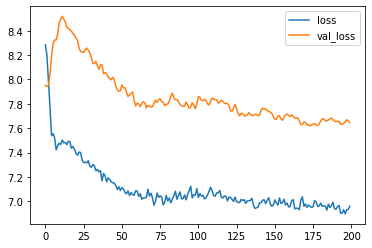

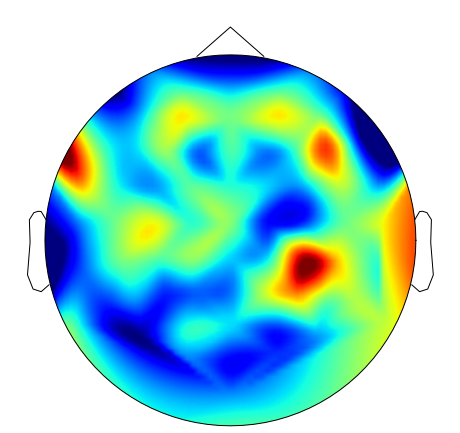

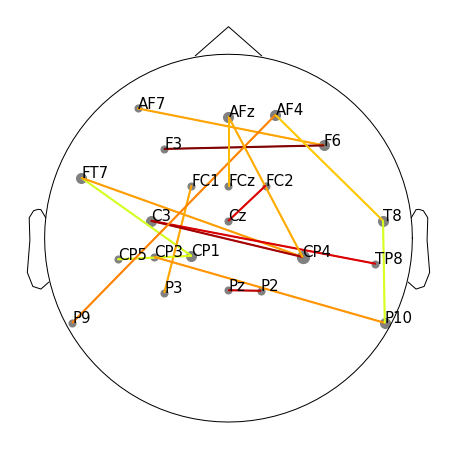

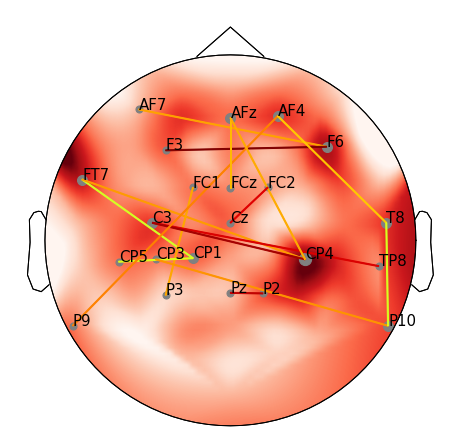

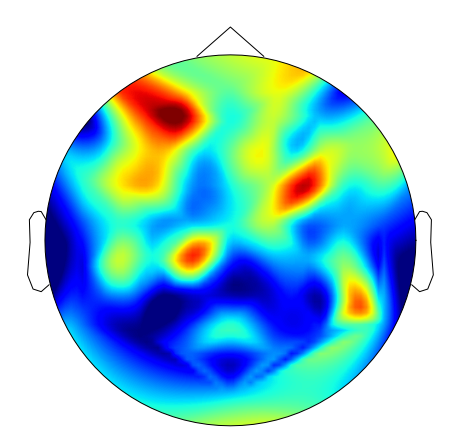

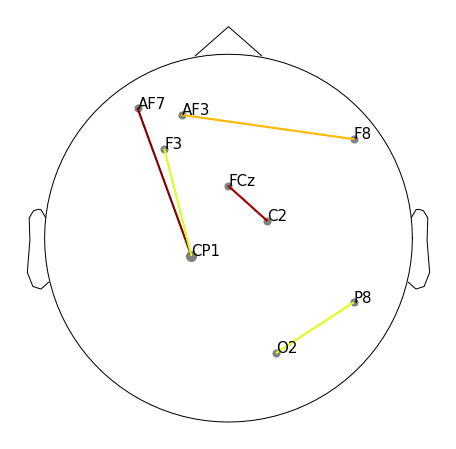

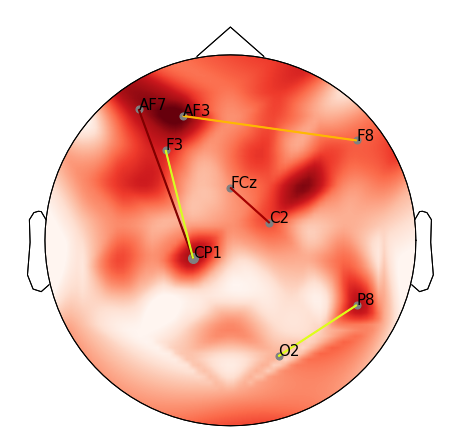

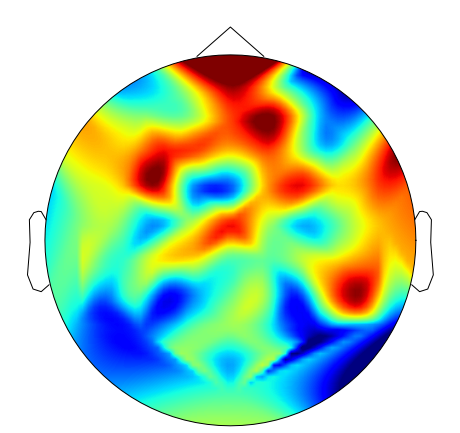

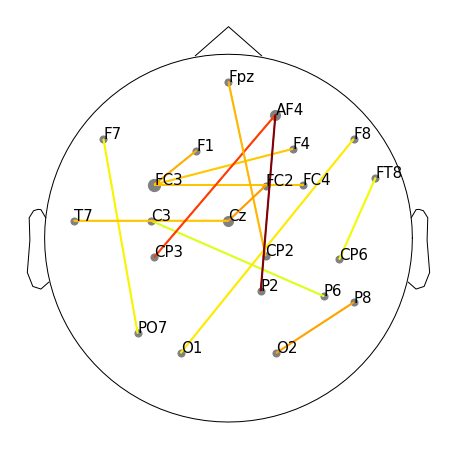

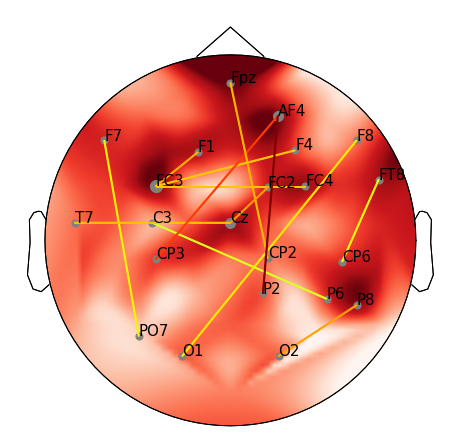

grupos:  [0, 1, 2]
run:  1
Epoch 1/200
2/2 [==============================] - 1s 282ms/step - loss: 722.2061 - val_loss: 683.2332
Epoch 2/200
2/2 [==============================] - 0s 267ms/step - loss: 703.8229 - val_loss: 640.0432
Epoch 3/200
2/2 [==============================] - 0s 90ms/step - loss: 649.1890 - val_loss: 607.2312
Epoch 4/200
2/2 [==============================] - 0s 100ms/step - loss: 605.1045 - val_loss: 559.4740
Epoch 5/200
2/2 [==============================] - 0s 92ms/step - loss: 555.4885 - val_loss: 514.5817
Epoch 6/200
2/2 [==============================] - 0s 89ms/step - loss: 512.8260 - val_loss: 479.8482
Epoch 7/200
2/2 [==============================] - 0s 81ms/step - loss: 476.7787 - val_loss: 444.0512
Epoch 8/200
2/2 [==============================] - 0s 85ms/step - loss: 440.6954 - val_loss: 410.8239
Epoch 9/200
2/2 [==============================] - 0s 83ms/step - loss: 408.2463 - val_loss: 379.2044
Epoch 10/200
2/2 [==============================] - 

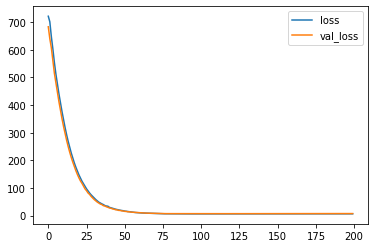

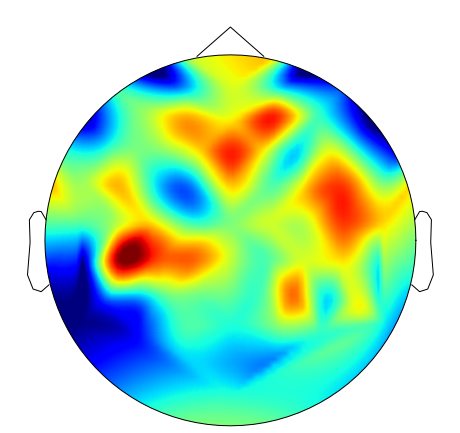

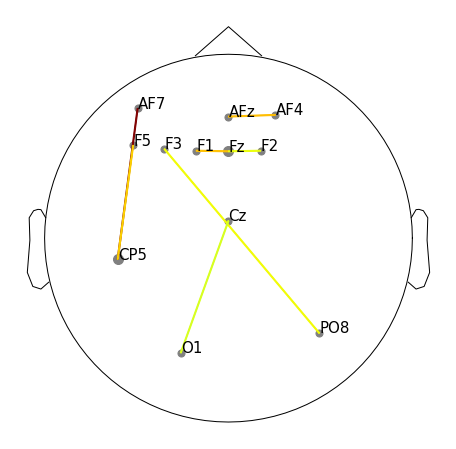

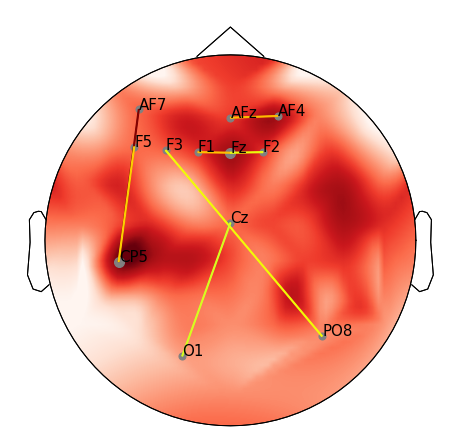

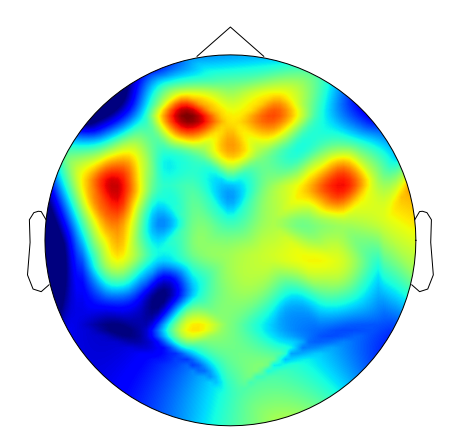

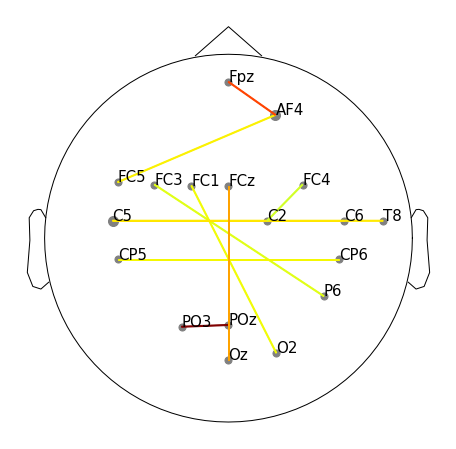

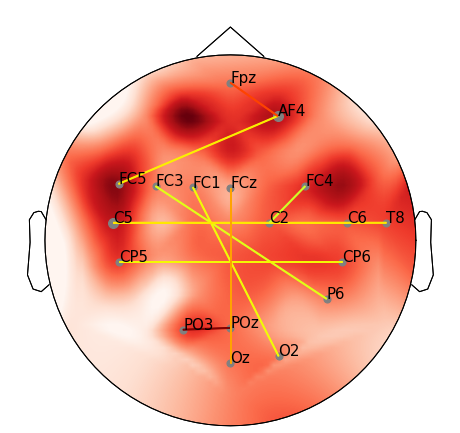

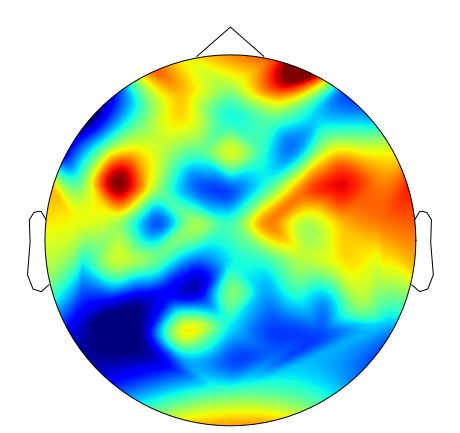

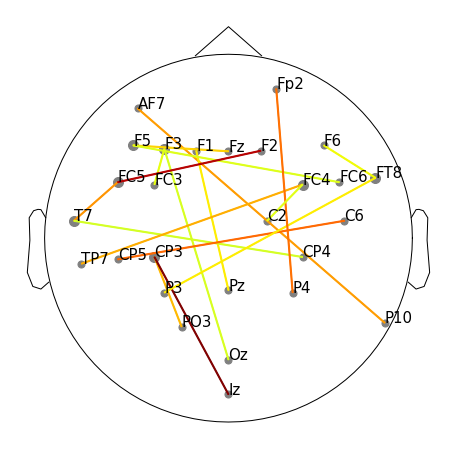

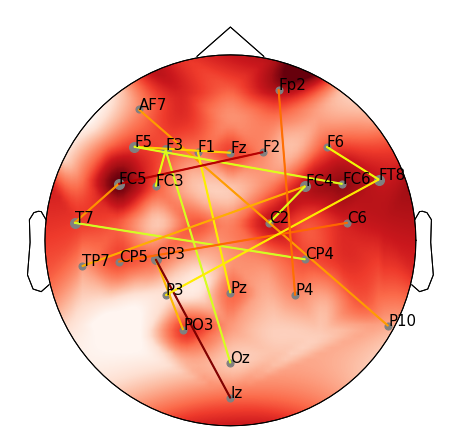

run:  2
Epoch 1/200
2/2 [==============================] - 1s 402ms/step - loss: 7.0851 - val_loss: 7.1266
Epoch 2/200
2/2 [==============================] - 0s 80ms/step - loss: 7.0427 - val_loss: 7.1260
Epoch 3/200
2/2 [==============================] - 0s 80ms/step - loss: 6.9358 - val_loss: 7.1218
Epoch 4/200
2/2 [==============================] - 0s 75ms/step - loss: 6.9088 - val_loss: 7.1331
Epoch 5/200
2/2 [==============================] - 0s 79ms/step - loss: 6.8624 - val_loss: 7.1937
Epoch 6/200
2/2 [==============================] - 0s 76ms/step - loss: 6.8556 - val_loss: 7.2596
Epoch 7/200
2/2 [==============================] - 0s 75ms/step - loss: 6.7787 - val_loss: 7.3177
Epoch 8/200
2/2 [==============================] - 0s 76ms/step - loss: 6.7567 - val_loss: 7.3497
Epoch 9/200
2/2 [==============================] - 0s 75ms/step - loss: 6.7234 - val_loss: 7.3348
Epoch 10/200
2/2 [==============================] - 0s 76ms/step - loss: 6.7488 - val_loss: 7.3547
Epoch 11/2

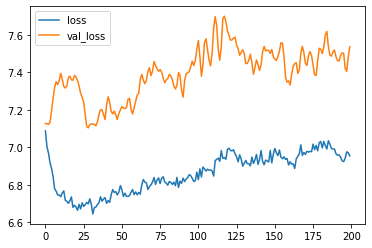

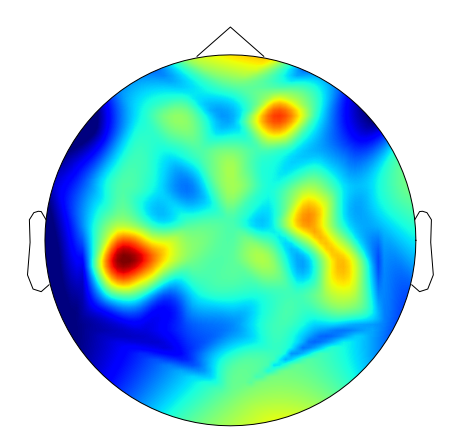

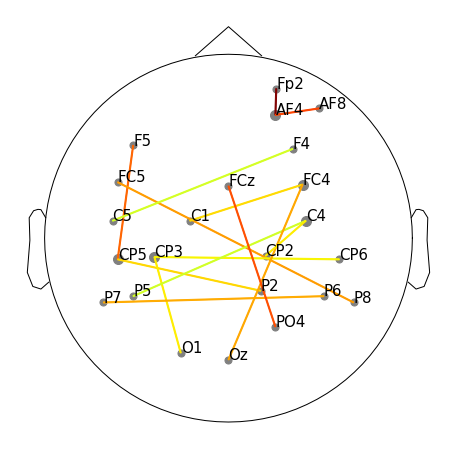

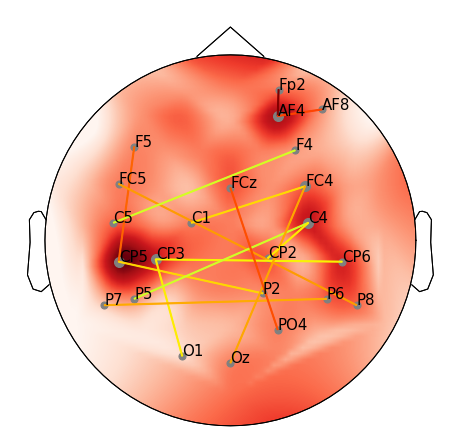

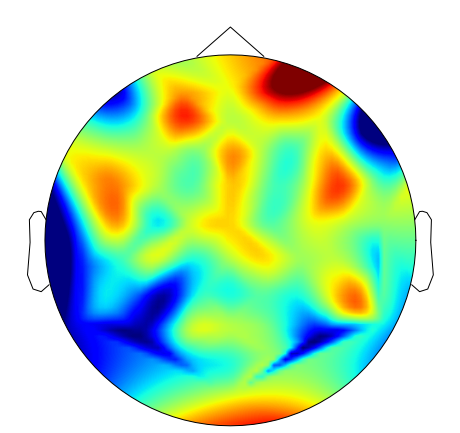

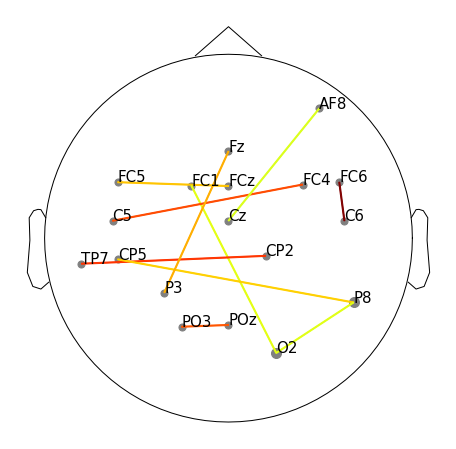

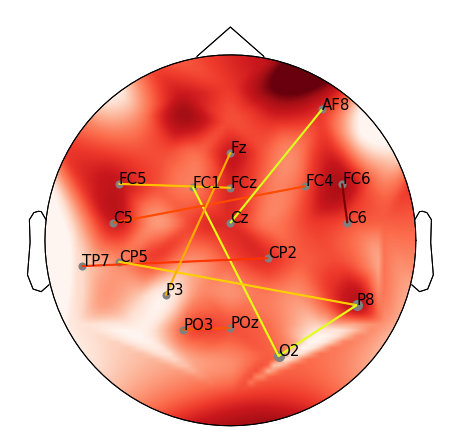

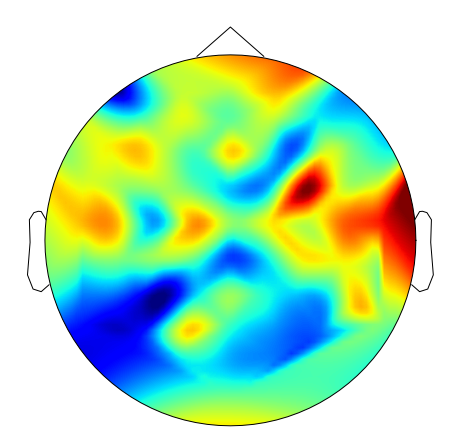

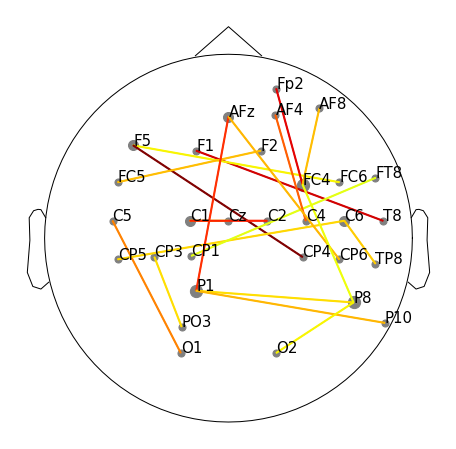

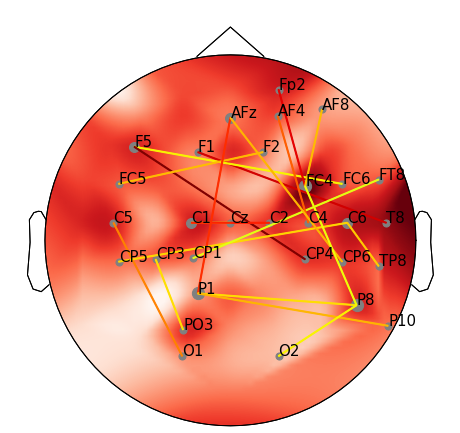

run:  3
Epoch 1/200
2/2 [==============================] - 1s 238ms/step - loss: 7.4961 - val_loss: 8.0966
Epoch 2/200
2/2 [==============================] - 0s 81ms/step - loss: 7.4675 - val_loss: 8.0743
Epoch 3/200
2/2 [==============================] - 0s 79ms/step - loss: 7.3018 - val_loss: 8.0376
Epoch 4/200
2/2 [==============================] - 0s 74ms/step - loss: 7.2632 - val_loss: 8.0369
Epoch 5/200
2/2 [==============================] - 0s 75ms/step - loss: 7.1916 - val_loss: 8.0022
Epoch 6/200
2/2 [==============================] - 0s 76ms/step - loss: 7.1643 - val_loss: 7.9650
Epoch 7/200
2/2 [==============================] - 0s 210ms/step - loss: 7.1415 - val_loss: 8.0098
Epoch 8/200
2/2 [==============================] - 0s 76ms/step - loss: 7.1278 - val_loss: 7.9981
Epoch 9/200
2/2 [==============================] - 0s 78ms/step - loss: 7.1040 - val_loss: 7.9731
Epoch 10/200
2/2 [==============================] - 0s 75ms/step - loss: 7.0460 - val_loss: 8.0016
Epoch 11/

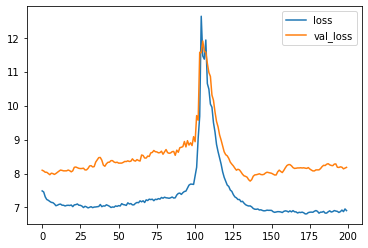

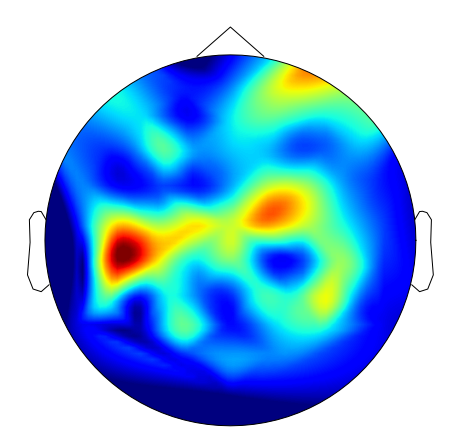

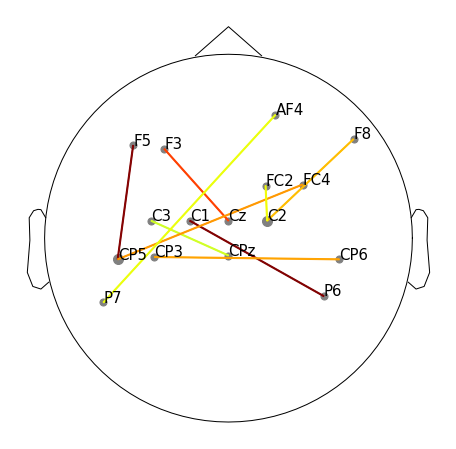

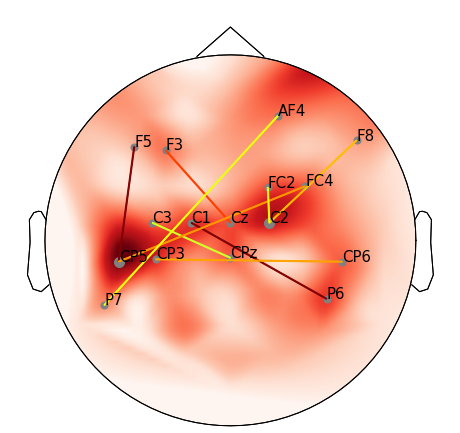

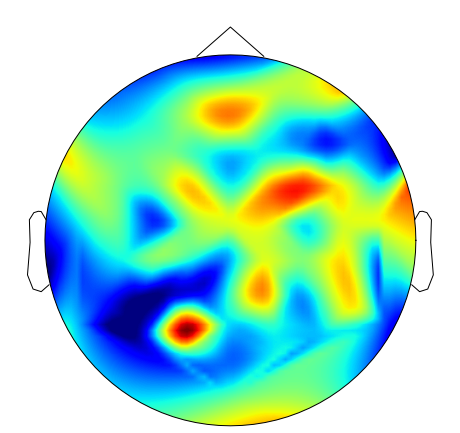

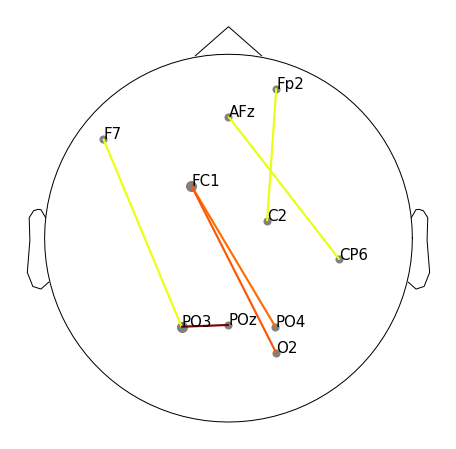

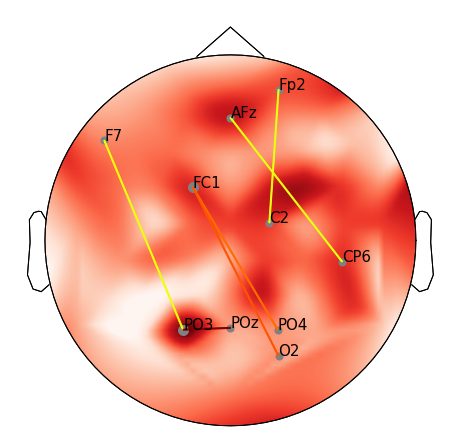

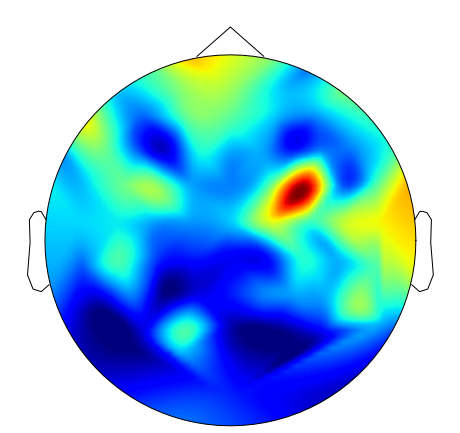

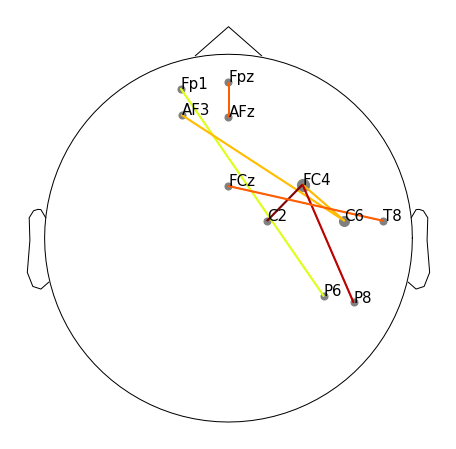

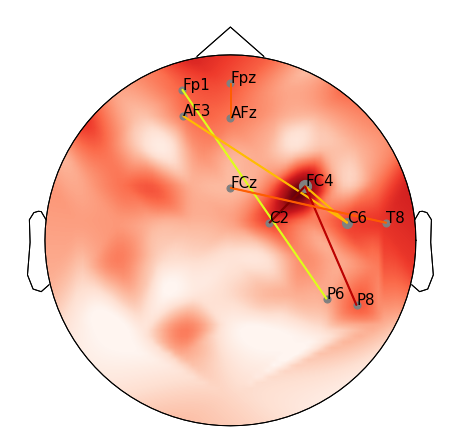

run:  4
Epoch 1/200
2/2 [==============================] - 1s 398ms/step - loss: 7.3725 - val_loss: 7.8964
Epoch 2/200
2/2 [==============================] - 0s 82ms/step - loss: 7.3191 - val_loss: 7.9090
Epoch 3/200
2/2 [==============================] - 0s 77ms/step - loss: 7.2571 - val_loss: 7.8955
Epoch 4/200
2/2 [==============================] - 0s 76ms/step - loss: 7.1837 - val_loss: 7.8914
Epoch 5/200
2/2 [==============================] - 0s 77ms/step - loss: 7.1366 - val_loss: 7.8598
Epoch 6/200
2/2 [==============================] - 0s 75ms/step - loss: 7.1016 - val_loss: 7.8116
Epoch 7/200
2/2 [==============================] - 0s 76ms/step - loss: 7.1235 - val_loss: 7.8326
Epoch 8/200
2/2 [==============================] - 0s 77ms/step - loss: 7.0971 - val_loss: 7.9198
Epoch 9/200
2/2 [==============================] - 0s 76ms/step - loss: 7.0933 - val_loss: 7.9245
Epoch 10/200
2/2 [==============================] - 0s 75ms/step - loss: 7.0893 - val_loss: 7.8791
Epoch 11/2

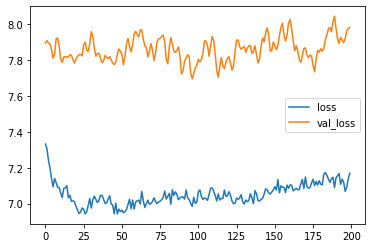

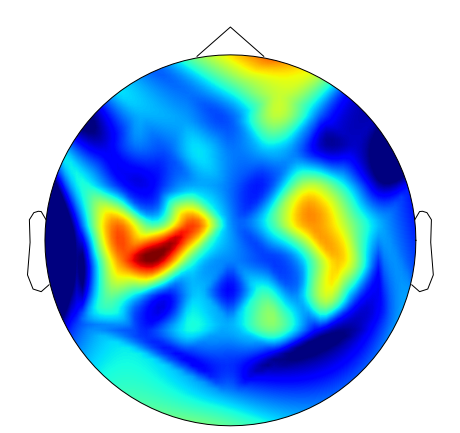

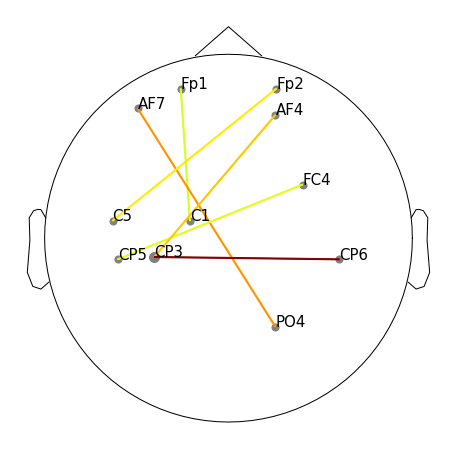

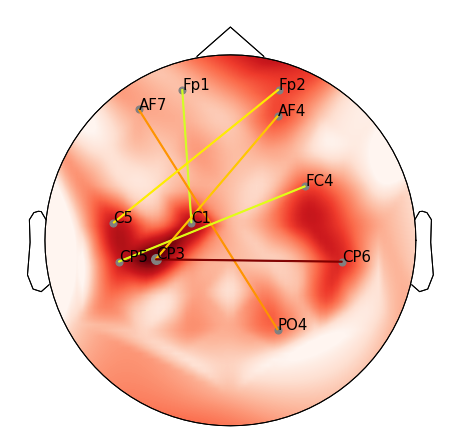

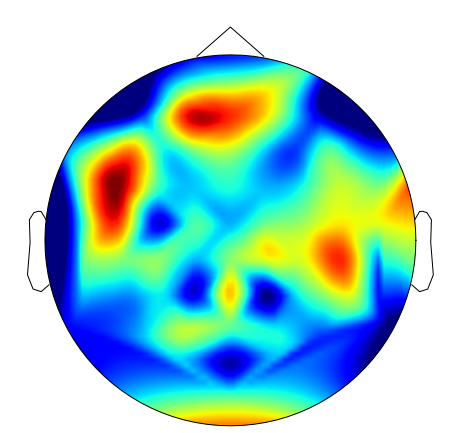

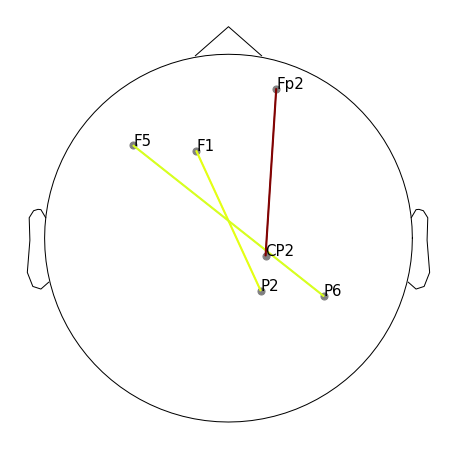

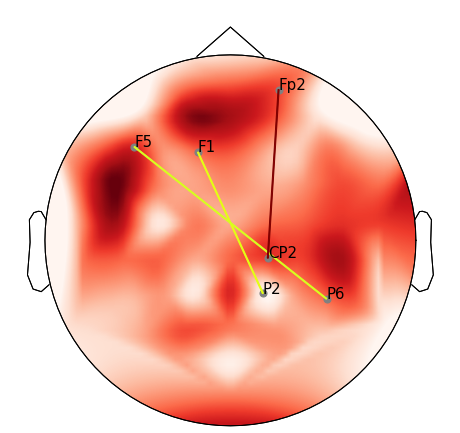

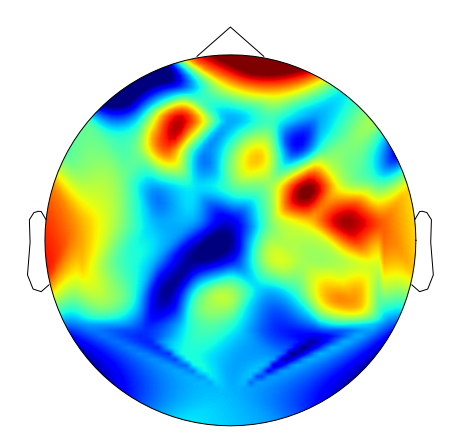

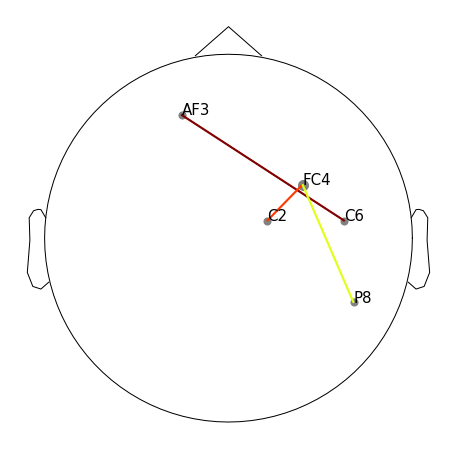

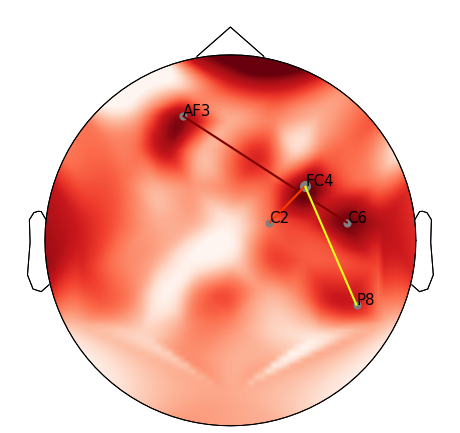

run:  5
Epoch 1/200
2/2 [==============================] - 1s 252ms/step - loss: 7.8943 - val_loss: 7.9084
Epoch 2/200
2/2 [==============================] - 0s 80ms/step - loss: 7.7093 - val_loss: 7.9102
Epoch 3/200
2/2 [==============================] - 0s 79ms/step - loss: 7.6918 - val_loss: 8.0320
Epoch 4/200
2/2 [==============================] - 0s 77ms/step - loss: 7.5186 - val_loss: 8.1795
Epoch 5/200
2/2 [==============================] - 0s 77ms/step - loss: 7.5059 - val_loss: 8.2578
Epoch 6/200
2/2 [==============================] - 0s 75ms/step - loss: 7.4802 - val_loss: 8.2981
Epoch 7/200
2/2 [==============================] - 0s 77ms/step - loss: 7.3856 - val_loss: 8.2695
Epoch 8/200
2/2 [==============================] - 0s 75ms/step - loss: 7.3964 - val_loss: 8.3367
Epoch 9/200
2/2 [==============================] - 0s 200ms/step - loss: 7.3699 - val_loss: 8.3621
Epoch 10/200
2/2 [==============================] - 0s 78ms/step - loss: 7.3252 - val_loss: 8.2769
Epoch 11/

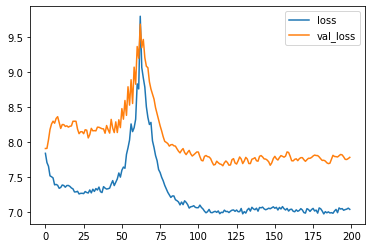

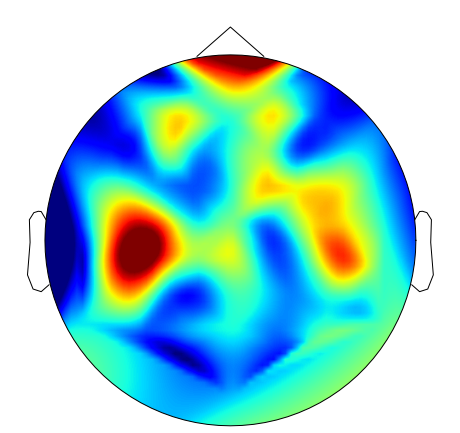

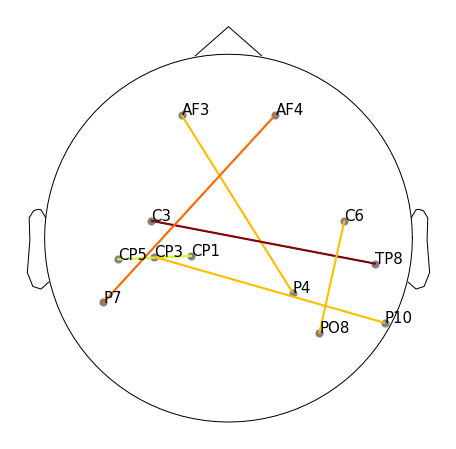

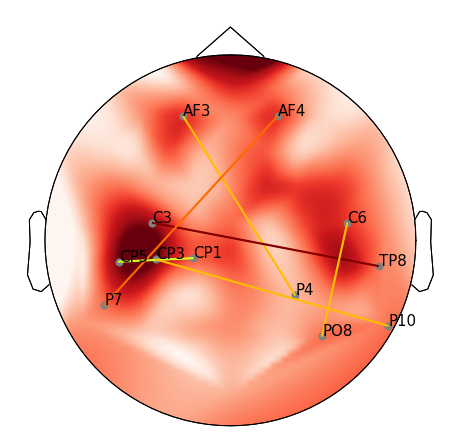

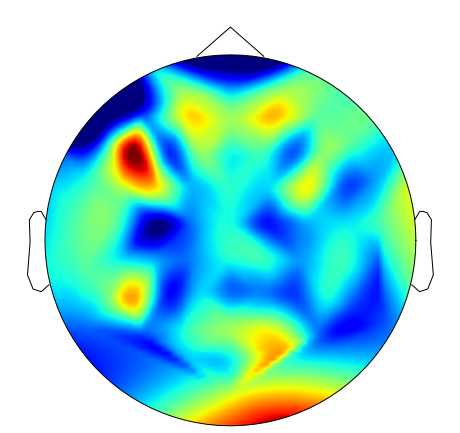

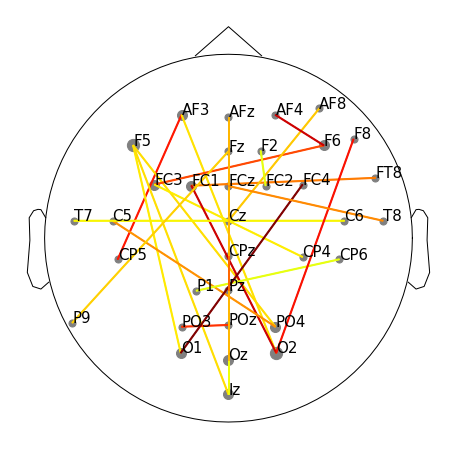

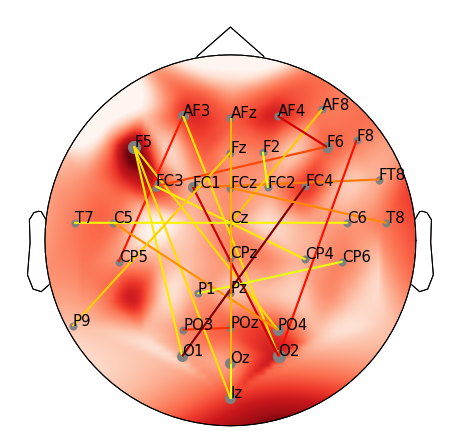

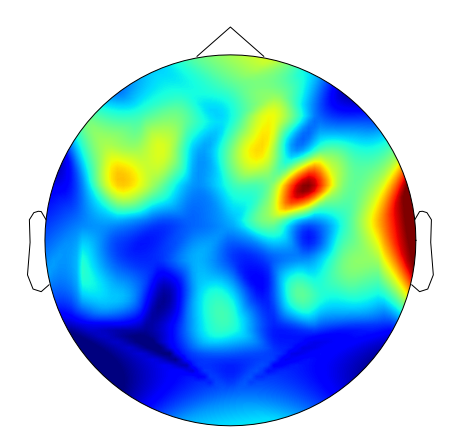

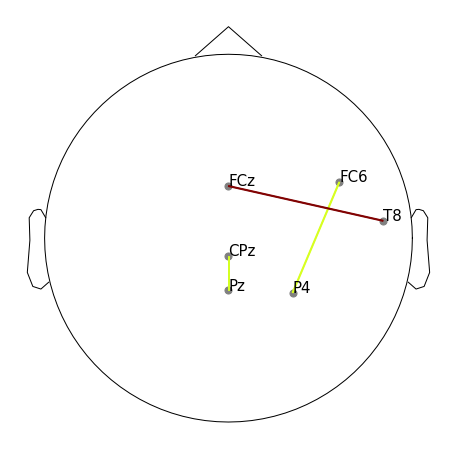

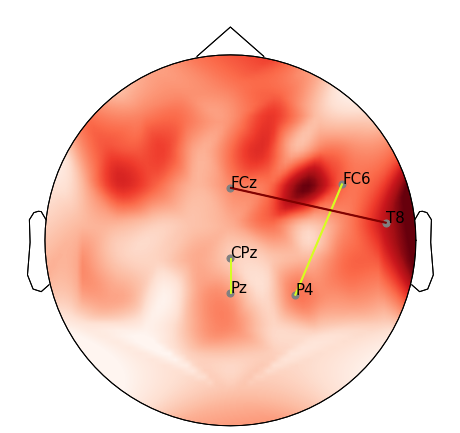

In [14]:
name_folder = 'Rest_vs_y_runs_transfer'

tipos =np.asarray([2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 1, 1, 1, 1 , 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1])#[1 2 3]

clases = [[2,None,None],[0,None,None],[1,None,None],[0,1,2]]

db = loaddb.GIGA()
channels_names = db.metadata['channel_names']
montage = mne.channels.read_montage(db.metadata['montage'])

groups_names = ['1','2','3','All']


path_models = Path_def+'/models/weigths_rest/'
c = 0
for tipe in clases:
  print('grupos:  '+ str(tipe) )
  #seleccion de index por clase de sujetos
  idx= (tipos==tipe[0]) + (tipos==tipe[1]) + (tipos==tipe[2])
  X = xtensor[idx,:,:]
  for r in range(5):
    print('run:  '+ str(r+1) )
    sc_ma = StandardScaler()
    y = sc_ma.fit_transform(Target_run[r][idx].reshape(-1,1))
    
    feats= SMRfeat()
    X_feat = feats.fit_transform(X)
    if r==0:
      initial_run = True
    else:
      initial_run = False

    net= MCSMRDNN_transfer(verbose=1,epochs=200,l1_param=1e-3,l2_param=1e-3,validation_split=0.1,plot_hst=True,alpha_dropout=False,path_in=path_models+'weigths_'+groups_names[c],path_out=path_models+'weigths_'+groups_names[c],run=r+1,initial_run=initial_run)
    predict_data = net.fit(X_feat , y)

    mdl = net.get_model()
    w = get_weigths(mdl,3)

    Model = {}
    Model["weigths"] = w
    Model["Ch_names"] = channels_names
    Model["montage"] = montage

    with open(Path_def+'models/'+name_folder+'/PLV_3f_MC_'+groups_names[c]+'_r'+str(r+1)+'.p','wb') as handle:
                    pickle.dump(Model,handle)

    plot_topomap_cx(w[0],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="topo",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_topo_t')
    plot_topomap_cx(w[0],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="Cx",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_Cx_t')
    plot_topomap_cx(w[0],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="All",cmaps="Reds",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_All_t')

    plot_topomap_cx(w[1],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="topo",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_topo_u')
    plot_topomap_cx(w[1],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="Cx",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_Cx_u')
    plot_topomap_cx(w[1],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="All",cmaps="Reds",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_All_u')

    plot_topomap_cx(w[2],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="topo",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_topo_B')
    plot_topomap_cx(w[2],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="Cx",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_Cx_B')
    plot_topomap_cx(w[2],512, channels_names,montage,Ch=len(channels_names), thr=0.6,size=(8,8),mode="All",cmaps="Reds",colormap=False,save=True,name=Path_def+'Topoplots/'+name_folder+'/G'+groups_names[c]+'/PLV_3f_MC_'+'_r'+str(r+1)+'_All_B')
  c+=1